In [1]:
%matplotlib inline
import sys
import os
sys.path.insert(0, '/home/groups/rwr/alpv95/tracksml')
import matplotlib.pyplot as plt
import h5py
import numpy as np
import shutil
import itertools
import copy
import torch
import pickle
import hexagdly
import copy as cp
from util import loss
from util.pydataloader import H5Dataset, ToTensor, ZNormalize
from collections import namedtuple
from nn.cnn import TrackAngleRegressor
from formats.dense_square import DenseSquareSimTracks
from formats.sparse_hex import SparseHexTracks, SparseHexSimTracks
from torchvision import transforms
from matplotlib.colors import LogNorm
from astropy.io import fits
from astropy import stats
import subprocess


home_dir = '/home/groups/rwr/alpv95/tracksml/'

def read_from_pickle(path):
    with open(path, 'rb') as file:
        try:
            while True:
                yield pickle.load(file) #yield gives a generator (effectively a list that only knows one element at a time)
                #containing the objects saved in the pickle 
        except EOFError:
            pass

#hd5py files are split into groups (->python dicts) and datasets (->python numpy arrays)
#usually will have format: e.g. dict(dict(numpyarray))
#i.e. f = h5py.File(filename, 'r'), f['key']['key2'][numpyarray index]
#get group keys using f.keys()
#if dataset has only a scalar value and not an array, access that single scalar element using [()] (this command shows whole array normally)

def read_hdf5(path):
    #filename = home_dir + 'data/nn/set2_combined_test_1/results/net3_0.h5'
    data_group = h5py.File(path, 'r')
    return data_group['root']

############## hd5py file to python dictionary
def recursively_load_dict_contents_from_group(h5file, path='root/'):
    """
    Load contents of an HDF5 group. If further groups are encountered,
    treat them like dicts and continue to load them recursively.
    """
    
    ans = {}
    for key, item in h5file[path].items():
        if type(item) is h5py._hl.dataset.Dataset:
            ans[key] = item[()]
        elif type(item) is h5py._hl.group.Group:
            ans[key] = recursively_load_dict_contents_from_group(h5file, path + key + '/')
    return ans

def plot_angle_preds(angles, phi0, C1, C2, mu, name=''):
    """Plot distribution of predicted track angles + overall predicted polarization angle + stats"""
    if name != '':
        name = name + ' '

    bins = np.linspace(-np.pi, np.pi, 40)

    x = np.linspace(-np.pi, np.pi, 199)
    N = C1 + C2 * np.square(np.cos(x - phi0))

    plt.figure()
    plt.hist(angles, bins=bins, density=True)
    plt.plot(x, N, linewidth=4, label='$C_1 + C_2\cos^2(\phi-\phi_0)$')
    plt.xlabel('$\phi$ (rad)')
    plt.ylabel('Prob')
    plt.legend()
    plt.title('{}Modulation Factor Params Fit\n$\phi_0$ = {:.3f}; $C_1$ = {:.3f}, $C_2$ = {:.3f}; $\mu$ = {:.3f}'.format(name, phi0, C1, C2, mu))
    
def plot_angle_preds_only(angles, name=''):
    """Plot just the hist of angles"""
    if name != '':
        name = name + ' '

    plt.figure()
    bins = np.linspace(-np.pi, np.pi, 40)
    plt.hist(angles, bins=bins, density=True)
    plt.xlabel('$\phi$ (rad)')
    plt.ylabel('Prob')
    plt.title('{}Distribution of predicted angles'.format(name))

/home/groups/rwr/alpv95/tracksml/nn/cnn.py:8: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/share/software/user/open/python/3.6.1/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/share/software/user/open/python/3.6.1/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/share/software/user/open/py-jupyter/1.0.0_py36/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/share/software/user/open/py-jupyter/1.0.0_py36/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/share/software/user/open/py-jupyter/1.0.0_p

In [3]:
data_dir = home_dir +'data/cleaned/set1_3p7_pol_meas_sparse_hex_tracks_cleaned.h5'
plt.figure(figsize=(19,19))
with h5py.File(data_dir, 'r') as f:
    flat_list = [item for sublist in np.ndarray.tolist(f['Q'][:30000]) for item in sublist if item >= 0]
    print(np.min(flat_list))
#     for i in range(1,37):
#         plt.subplot(6,6,i)
#         plt.scatter(f['x'][i],f['y'][i],f['Q'][i])

10


In [12]:
with h5py.File(data_dir, 'r') as f:
    print(f['Q'][10])

[  3   5  10  10   3   6   9  11   9   5   9  13  23  40  39  23  18   3
  11  29  46  80  87  49  20   3   5   3   9  29  54  78 111  83  36   9
   7   4   8  14  49  73 114  92  50  10   4   5  10  35  59 103 103  62
  25   5   3   9  10  43  68  89  70  30  13   6  15  38  39  46  35  12
   3   7  16  21  13  12   5   4   5  -1  -1  -1  -1  -1  -1  -1  -1  -1
  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1
  -1  -1  -1  -1  -1  -1  -1  -1]


In [ ]:
from astropy.io import fits
data_dir = home_dir +"data/gen2a/gen2_ang45_3p4.fits"
with fits.open(data_dir, memmap=False) as hdu:
    hdu.info()
    print(hdu[1].columns)
    data = hdu[1].data
    print(hdu[2].columns)
    print(hdu[3].columns)


In [19]:
data['BARX'][abs(data['BARX']) > 1].size 

2108

In [25]:
from astropy.io import fits
data_dir = home_dir + "data/GPD_EM_data/GPD_EM_Deepflatfield_unpolarized/109_0000069_data_recon_no_elec.fits"
#"data/GPD_EM_data/GPD_EM_Deepflatfield_unpolarized/109_0000069_data_gainmap.fits"
#"data/Reconstruction_Optimization_Benchmark/Measures/6p4keV_pol/xpol_2747_recon.fits"
#"data/GPD_EM_data/GPD_EM_Deepflatfield_unpolarized/109_0000069_data_reconElecCorr.fits"
with fits.open(data_dir, memmap=False) as hdu:
    hdu.info()
    #gain = hdu[0].data
    print(hdu[2].columns)
    phis = hdu[1].data['DETPHI']
    absx = hdu[1].data['DETX']
    absy = hdu[1].data['DETY']


Filename: /home/groups/kipac/alpv95/tracksml/data/GPD_EM_data/GPD_EM_Deepflatfield_unpolarized/109_0000069_data_recon_no_elec.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      40   ()      
  1  EVENTS        1 BinTableHDU    163   3841990R x 38C   [1J, 1J, 1K, 1J, 1D, 1J, 1I, 1I, 1I, 1I, 1J, 1I, 1I, 1I, 1I, 1I, 1I, 1D, 1D, 1I, 1I, 1J, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 200D, 200D, 200D, 200I]   
  2  GTI           1 BinTableHDU     33   1R x 2C   [1D, 1D]   


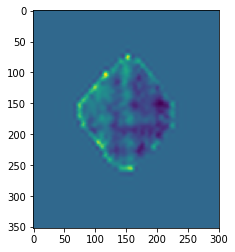

In [10]:
plt.imshow(gain)

In [26]:
idxs_x = np.digitize(absx, bins=[-3,-2,-1,0,1,2,3])
idxs_y = np.digitize(absy, bins=[-3,-2,-1,0,1,2,3])
idxs = zip(list(idxs_x), list(idxs_y))
coords = list(set(idxs))
mod_dict = {coord : [] for coord in coords}

for i,(x,y) in enumerate(zip(list(idxs_x), list(idxs_y))):
    mod_dict[(x,y)].append(phis[i])
    

In [27]:
angles = np.array(phis)
mu = 2*np.sqrt(sum(np.cos(2*angles))**2 + sum(np.sin(2*angles))**2) / len(angles)
mu = 2*np.sqrt(sum(np.cos(2*v))**2 + sum(np.sin(2*v))**2) / len(v)
phi = np.arctan2(sum(np.sin(2*angles)),sum(np.cos(2*angles)))/2
print(mu, phi)

phi0, _, _ = fit_polarization_angle(angles, method='mse', output_errors=True, use_parallel=False,use_grid_search=True, use_gradient=True, verbose=False)
C1, C2 = fit_modulation_factor_params(angles, phi0)
print(modulation_factor(C1, C2), phi0)


0.048824315695887716 -1.0184265168799806
0.02250837762995769 0.04376373019585368


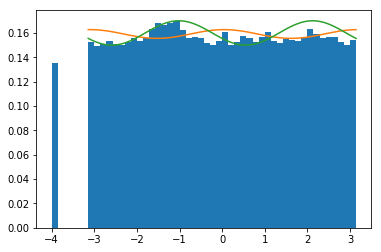

In [28]:
plt.hist(angles, bins=50, density=True)
plt.plot(np.linspace(-np.pi,np.pi,100), C1 + C2*np.cos(np.linspace(-np.pi,np.pi,100) - phi0)**2)
plt.plot(np.linspace(-np.pi,np.pi,100), 0.15 + 0.02*np.cos(np.linspace(-np.pi,np.pi,100) - phi)**2)


In [29]:
final = []
for k,v in mod_dict.items():
#     phi0, _, _ = fit_polarization_angle(v, method='mse', output_errors=True, use_parallel=False,use_grid_search=True, use_gradient=True, verbose=False)
#     C1, C2 = fit_modulation_factor_params(v, phi0)
#     if k[1] > 0 and (k[0]-3.5)**2 + (k[1]-3.5)**2 <= 3.5**2 + 0.6**2 and modulation_factor(C1, C2) < 0.2:
#         final.append((k[0]-3.5, k[1]-3.5, modulation_factor(C1, C2), phi0))
    v = np.array(v)
    mu = 2*np.sqrt(sum(np.cos(2*v))**2 + sum(np.sin(2*v))**2) / len(v)
    phi0 = np.arctan2(sum(np.sin(2*v)),sum(np.cos(2*v)))/2
    if k[1] > 0 and (k[0]-3.5)**2 + (k[1]-3.5)**2 <= 3.5**2 + 0.6**2 and mu < 0.15:
        final.append((k[0]-3.5, k[1]-3.5, mu, phi0))
    

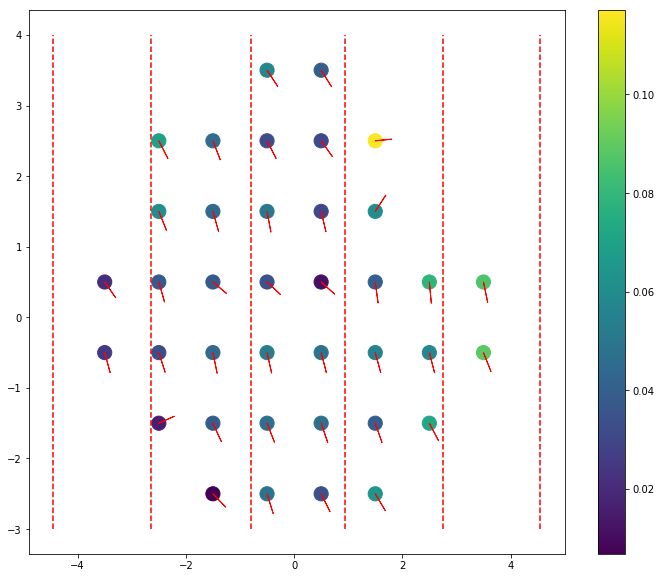

In [30]:
finall = np.array(final)

plt.figure(figsize=(12,10))
plt.scatter(finall[:,0], finall[:,1], c=finall[:,2], cmap='viridis', s=200)
plt.colorbar()
for (x,y,_, phi) in final:
    plt.arrow(x, y, 0.3 * np.cos(phi), 0.3 * np.sin(phi), color='r')
plt.plot([0.95,0.95],[-3,4],'r--')
plt.plot([-0.85-1.8,-0.85-1.8],[-3,4],'r--')
plt.plot([-0.8,-0.8],[-3,4],'r--')
plt.plot([0.95+1.8,0.95+1.8],[-3,4],'r--')
plt.plot([-0.85-3.6,-0.85-3.6],[-3,4],'r--')
plt.plot([0.95+3.6,0.95+3.6],[-3,4],'r--')


In [3]:
xflat = np.ndarray.flatten(data['PIX_X'])
yflat = np.ndarray.flatten(data['PIX_Y'])
phaflat = np.ndarray.flatten(data['PIX_PHA'])

nanmask = ~np.isnan(xflat)
yflat = yflat[nanmask]
phaflat = phaflat[nanmask]
xflat = xflat[nanmask]

mask = (abs(xflat)<6) * (abs(yflat)<6)
phaflat = phaflat[mask]
xflat = xflat[mask]
yflat = yflat[mask]

coords = list(set(zip(xflat,yflat)))
print(len(coords))
hexdict = {coord : 0 for coord in coords}

58010


In [4]:
cols = list(set(xflat))
print(len(cols))
hexcols = {col : 0 for col in cols}

481


In [34]:
for x,pha in zip(xflat,phaflat):
    hexdict[x] += pha 

KeyError: 0.9875000000000007

In [5]:
for x,y,pha in zip(xflat,yflat,phaflat):
    hexdict[(x,y)] += pha 

In [6]:
x = [i[0][0] for i in hexdict.items()]
y = [i[0][1] for i in hexdict.items()]
pha = [i[1] for i in hexdict.items()]

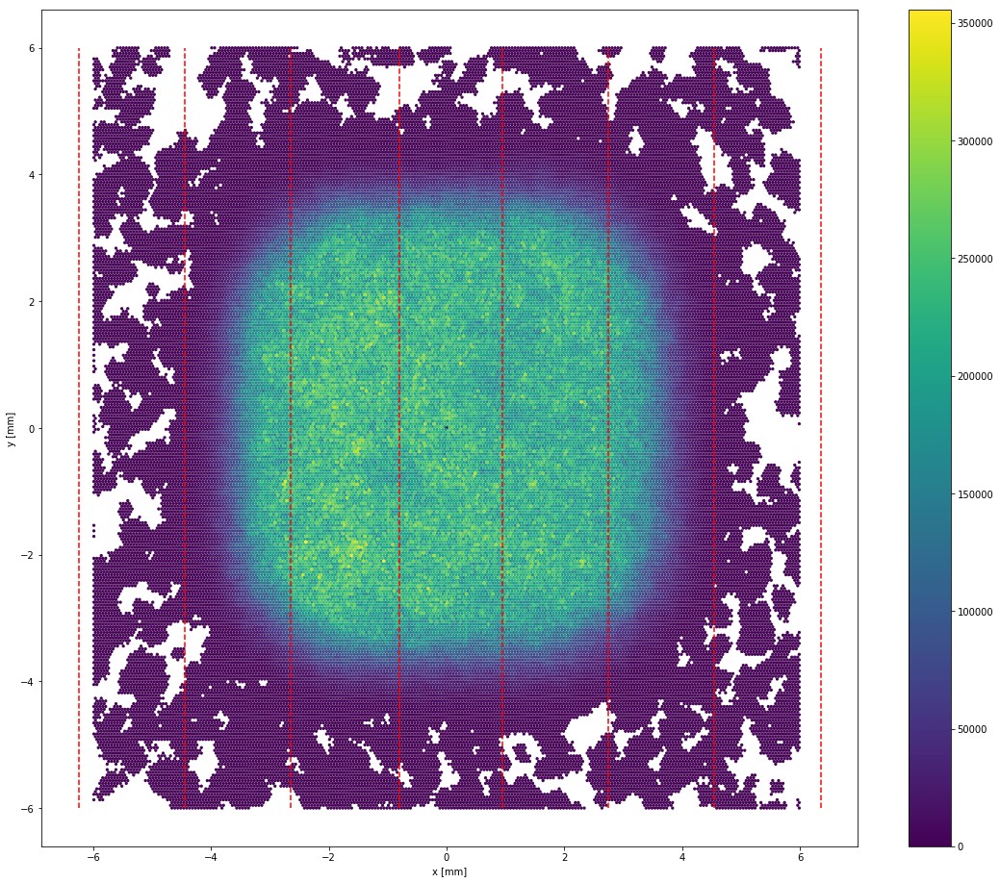

In [7]:
plt.figure(figsize=(19,16))
plt.scatter(x,y,c=pha, cmap='viridis',s=5)
plt.plot([0.95,0.95],[-6,6],'r--')
plt.plot([-0.85-1.8,-0.85-1.8],[-6,6],'r--')
plt.plot([-0.8,-0.8],[-6,6],'r--')
plt.plot([0.95+1.8,0.95+1.8],[-6,6],'r--')
plt.plot([-0.85-3.6,-0.85-3.6],[-6,6],'r--')
plt.plot([0.95+3.6,0.95+3.6],[-6,6],'r--')
plt.plot([-0.85-5.4,-0.85-5.4],[-6,6],'r--')
plt.plot([0.95+5.4,0.95+5.4],[-6,6],'r--')
plt.xlabel('x [mm]')
plt.ylabel('y [mm]')
plt.colorbar()

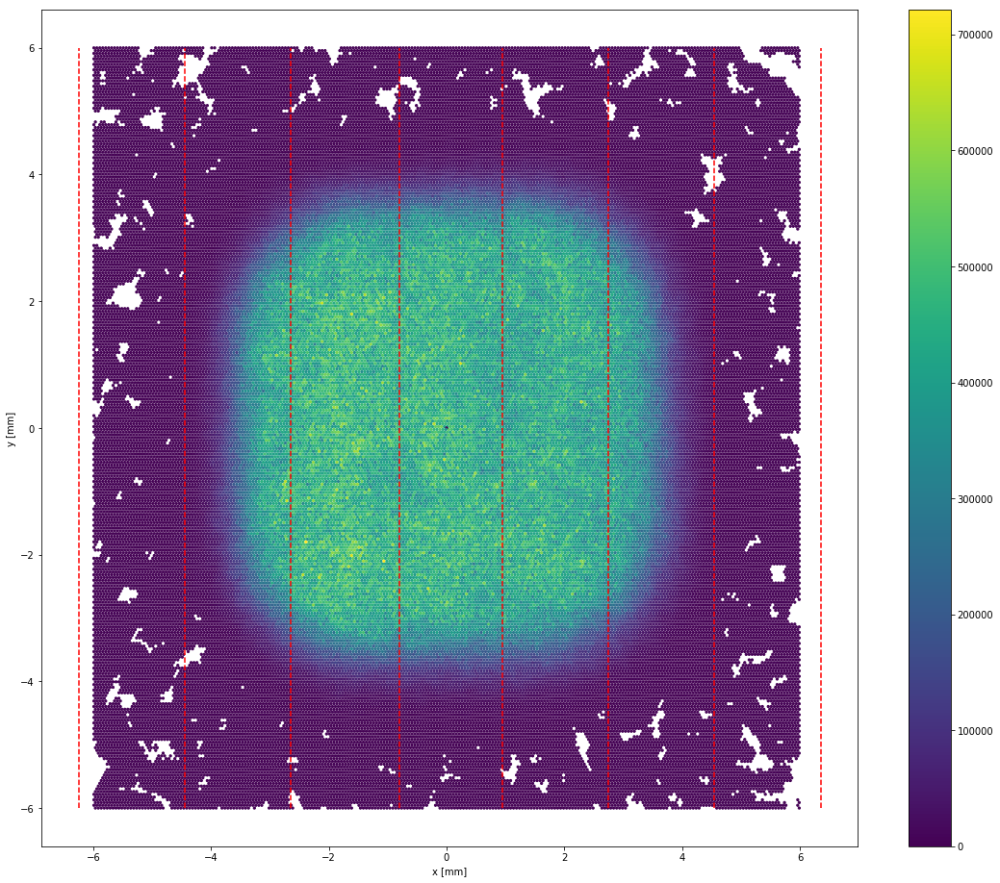

In [26]:
plt.figure(figsize=(19,16))
plt.scatter(x,y,c=pha, cmap='viridis',s=5)
plt.plot([0.95,0.95],[-6,6],'r--')
plt.plot([-0.85-1.8,-0.85-1.8],[-6,6],'r--')
plt.plot([-0.8,-0.8],[-6,6],'r--')
plt.plot([0.95+1.8,0.95+1.8],[-6,6],'r--')
plt.plot([-0.85-3.6,-0.85-3.6],[-6,6],'r--')
plt.plot([0.95+3.6,0.95+3.6],[-6,6],'r--')
plt.plot([-0.85-5.4,-0.85-5.4],[-6,6],'r--')
plt.plot([0.95+5.4,0.95+5.4],[-6,6],'r--')
plt.xlabel('x [mm]')
plt.ylabel('y [mm]')
plt.colorbar()

In [30]:
allp = list(zip(np.ndarray.flatten(data['PIX_X']),np.ndarray.flatten(data['PIX_Y']), np.ndarray.flatten(data['PIX_PHA'])))

#plt.scatter(data['PIX_X'],data['PIX_Y'],data['PIX_PHA'])

In [31]:
allp[0]

(-0.5374999999999996, -0.7577500000000006, 21)

In [116]:
data64['PIX_X'][1][np.isfinite(data64['PIX_X'][1])]
data64['PIX_Y'][1][np.isfinite(data64['PIX_Y'][1])]

array([1.40725, 1.36395, 1.36395, 1.32065, 1.32065, 1.32065, 1.32065,
       1.27735, 1.27735, 1.23405, 1.23405, 1.23405, 1.19075, 1.19075,
       1.19075, 1.19075, 1.14745, 1.14745, 1.14745, 1.14745, 1.14745,
       1.10415, 1.10415, 1.10415, 1.10415, 1.10415, 1.06085, 1.06085,
       1.06085, 1.06085, 1.06085, 1.01755, 1.01755, 1.01755, 1.01755,
       1.01755, 0.97425, 0.97425, 0.97425, 0.97425, 0.97425, 0.93095,
       0.93095, 0.93095, 0.93095, 0.93095, 0.88765, 0.88765, 0.88765,
       0.88765, 0.88765, 0.88765, 0.88765, 0.84435, 0.84435, 0.84435,
       0.84435, 0.84435, 0.84435, 0.84435, 0.80105, 0.80105, 0.80105,
       0.80105, 0.80105, 0.80105, 0.80105, 0.75775, 0.75775, 0.75775,
       0.75775, 0.75775, 0.75775, 0.71445, 0.71445, 0.71445, 0.71445,
       0.71445, 0.71445, 0.67115, 0.67115, 0.67115, 0.67115, 0.67115,
       0.67115, 0.62785, 0.62785, 0.62785, 0.62785, 0.62785, 0.62785,
       0.58455, 0.58455, 0.58455, 0.58455, 0.58455, 0.54125])

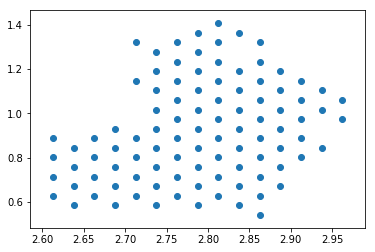

In [118]:
plt.scatter(data64['PIX_X'][1][np.isfinite(data64['PIX_X'][1])], data64['PIX_Y'][1][np.isfinite(data64['PIX_Y'][1])])

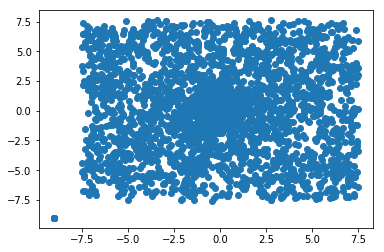

In [50]:
plt.scatter(data['DETX'], data['DETY'])
#plt.scatter(data64['BARX'], data64['BARY'])
#plt.scatter(datax['BARX'], datax['BARY'])
#plt.scatter(data64['PIX_X'][1][np.isfinite(data64['PIX_X'][1])], data64['PIX_Y'][1][np.isfinite(data64['PIX_Y'][1])])
#plt.scatter(datax['PIX_X'][1][np.isfinite(datax['PIX_X'][1])], datax['PIX_Y'][1][np.isfinite(datax['PIX_Y'][1])])
#plt.scatter(data64['PIX_X'][0], data64['PIX_Y'][0],'g')

In [54]:
tracks, angles, mom_phis, moms, abs_pts, energies = torch.load(home_dir + "data/expanded/gen4_pl_low/train/data_full.pt")

In [30]:
energies[:50]

tensor([3.9000, 3.6000, 3.5000, 3.7000, 3.8000, 3.7000, 3.8000, 3.8000, 3.7000,
        3.6000, 3.8000, 3.6000, 3.5000, 3.6000, 3.5000, 3.7000, 3.6000, 3.7000,
        3.8000, 3.5000, 3.7000, 3.9000, 3.5000, 3.7000, 3.9000, 3.5000, 3.5000,
        3.8000, 3.8000, 3.6000, 3.9000, 3.6000, 3.5000, 3.6000, 3.9000, 3.6000,
        3.7000, 3.9000, 3.7000, 3.5000, 3.5000, 3.6000, 3.6000, 3.9000, 3.6000,
        3.9000, 3.5000, 3.5000, 3.8000, 3.7000])

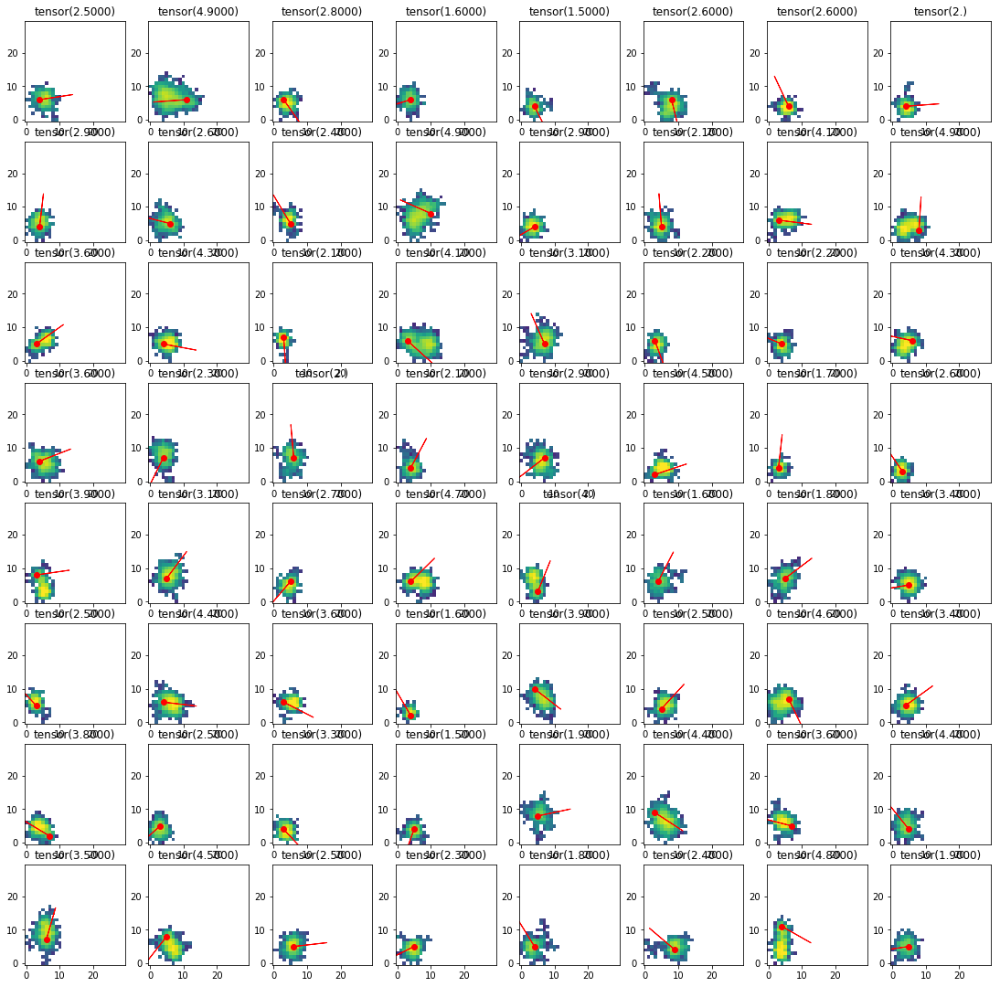

In [60]:
plt.figure(figsize=(19,19))
for i in range(1,65):
    plt.subplot(8,8,i)
    plt.imshow(tracks[i][0],norm=LogNorm(vmin=3, vmax=800),origin='lower')
    plt.scatter(abs_pts[i][0][0],abs_pts[i][0][1],c='r')
    plt.arrow(abs_pts[i][0][0],abs_pts[i][0][1],10 * np.cos(angles[i][0]), 10 * np.sin(angles[i][0]),color='r')
    plt.title(energies[i])

In [8]:
x = torch.zeros((2000,4,30,30))
y = torch.ones((156,4,30,30))

In [19]:
y = torch.ones((156,4,30,30)) * 10

In [15]:
x[0:156] = y

In [20]:
x[0]

tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]],

        [[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 

In [11]:
x.shape

torch.Size([2000, 4, 30, 30])

In [2]:
home_dir = "/scratch/groups/rwr/alpv95/"

In [3]:
X = torch.load(home_dir + "data/expanded/gen4_pl_high/train/ZN.pt")

In [7]:
X[1].shape

torch.Size([30, 30])

In [13]:
x[156,3,2,5]

tensor(1.)

In [19]:
#data_dirs = #["data/2.0keV_Unpol/104_0004350/104_0004350_data_reconOG.fits","data/2.0keV_Unpol/104_0004350/104_0004350_data_reconPedCorGainNorm.fits",
data_dirs = ["data/gen4/gen4_ang{}_{}.fits".format(int(angle),str(np.round(energy,2)).replace(".","p")) 
             for angle in np.linspace(0,170,18) for energy in np.arange(1.0,9.1,0.1) ]
#data_dirs = ["data/gen4/gen4_{}.fits".format(str(np.round(energy,2)).replace(".","p")) 
             #for energy in np.arange(1.0,9.1,0.1) ]
#data_dirs = ["data/gen4/gen4_1p0.fits","data/gen4/gen4_7p0.fits"]
data_dirs = [home_dir + s for s in data_dirs]

data = []
monte = []
for data_dir in data_dirs:
    with fits.open(data_dir, memmap=False) as hdu:
        if "gainmap" in data_dir:
            data.append(hdu[0].data)
        else:
            print(data_dir.replace(home_dir,""), len(hdu[3].data["PE_PHI"]))
            #print(hdu[3].columns)
            #data.append(hdu[3].data)

data/gen4/gen4_ang0_1p0.fits 5000
data/gen4/gen4_ang0_1p1.fits 5000
data/gen4/gen4_ang0_1p2.fits 5000
data/gen4/gen4_ang0_1p3.fits 5000
data/gen4/gen4_ang0_1p4.fits 5000
data/gen4/gen4_ang0_1p5.fits 10000
data/gen4/gen4_ang0_1p6.fits 10000
data/gen4/gen4_ang0_1p7.fits 10000
data/gen4/gen4_ang0_1p8.fits 10000
data/gen4/gen4_ang0_1p9.fits 10000
data/gen4/gen4_ang0_2p0.fits 10000
data/gen4/gen4_ang0_2p1.fits 10000
data/gen4/gen4_ang0_2p2.fits 10000
data/gen4/gen4_ang0_2p3.fits 10000
data/gen4/gen4_ang0_2p4.fits 10000
data/gen4/gen4_ang0_2p5.fits 10000
data/gen4/gen4_ang0_2p6.fits 10000
data/gen4/gen4_ang0_2p7.fits 10000
data/gen4/gen4_ang0_2p8.fits 10000
data/gen4/gen4_ang0_2p9.fits 10000
data/gen4/gen4_ang0_3p0.fits 10000
data/gen4/gen4_ang0_3p1.fits 10000
data/gen4/gen4_ang0_3p2.fits 10000
data/gen4/gen4_ang0_3p3.fits 10000
data/gen4/gen4_ang0_3p4.fits 10000
data/gen4/gen4_ang0_3p5.fits 10000
data/gen4/gen4_ang0_3p6.fits 10000
data/gen4/gen4_ang0_3p7.fits 10000
data/gen4/gen4_ang0_3p8.f

data/gen4/gen4_ang20_7p9.fits 10000
data/gen4/gen4_ang20_8p0.fits 10000
data/gen4/gen4_ang20_8p1.fits 10000
data/gen4/gen4_ang20_8p2.fits 10000
data/gen4/gen4_ang20_8p3.fits 10000
data/gen4/gen4_ang20_8p4.fits 10000
data/gen4/gen4_ang20_8p5.fits 10000
data/gen4/gen4_ang20_8p6.fits 10000
data/gen4/gen4_ang20_8p7.fits 10000
data/gen4/gen4_ang20_8p8.fits 10000
data/gen4/gen4_ang20_8p9.fits 10000
data/gen4/gen4_ang20_9p0.fits 10000
data/gen4/gen4_ang30_1p0.fits 5000
data/gen4/gen4_ang30_1p1.fits 5000
data/gen4/gen4_ang30_1p2.fits 5000
data/gen4/gen4_ang30_1p3.fits 5000
data/gen4/gen4_ang30_1p4.fits 5000
data/gen4/gen4_ang30_1p5.fits 10000
data/gen4/gen4_ang30_1p6.fits 10000
data/gen4/gen4_ang30_1p7.fits 10000
data/gen4/gen4_ang30_1p8.fits 10000
data/gen4/gen4_ang30_1p9.fits 10000
data/gen4/gen4_ang30_2p0.fits 10000
data/gen4/gen4_ang30_2p1.fits 10000
data/gen4/gen4_ang30_2p2.fits 10000
data/gen4/gen4_ang30_2p3.fits 10000
data/gen4/gen4_ang30_2p4.fits 10000
data/gen4/gen4_ang30_2p5.fits 100

data/gen4/gen4_ang50_6p4.fits 10000
data/gen4/gen4_ang50_6p5.fits 10000
data/gen4/gen4_ang50_6p6.fits 10000
data/gen4/gen4_ang50_6p7.fits 10000
data/gen4/gen4_ang50_6p8.fits 10000
data/gen4/gen4_ang50_6p9.fits 10000
data/gen4/gen4_ang50_7p0.fits 10000
data/gen4/gen4_ang50_7p1.fits 10000
data/gen4/gen4_ang50_7p2.fits 10000
data/gen4/gen4_ang50_7p3.fits 10000
data/gen4/gen4_ang50_7p4.fits 10000
data/gen4/gen4_ang50_7p5.fits 10000
data/gen4/gen4_ang50_7p6.fits 10000
data/gen4/gen4_ang50_7p7.fits 10000
data/gen4/gen4_ang50_7p8.fits 10000
data/gen4/gen4_ang50_7p9.fits 10000
data/gen4/gen4_ang50_8p0.fits 10000
data/gen4/gen4_ang50_8p1.fits 10000
data/gen4/gen4_ang50_8p2.fits 10000
data/gen4/gen4_ang50_8p3.fits 10000
data/gen4/gen4_ang50_8p4.fits 10000
data/gen4/gen4_ang50_8p5.fits 10000
data/gen4/gen4_ang50_8p6.fits 10000
data/gen4/gen4_ang50_8p7.fits 10000
data/gen4/gen4_ang50_8p8.fits 10000
data/gen4/gen4_ang50_8p9.fits 10000
data/gen4/gen4_ang50_9p0.fits 10000
data/gen4/gen4_ang60_1p0.fit

data/gen4/gen4_ang80_4p9.fits 10000
data/gen4/gen4_ang80_5p0.fits 10000
data/gen4/gen4_ang80_5p1.fits 10000
data/gen4/gen4_ang80_5p2.fits 10000
data/gen4/gen4_ang80_5p3.fits 10000
data/gen4/gen4_ang80_5p4.fits 10000
data/gen4/gen4_ang80_5p5.fits 10000
data/gen4/gen4_ang80_5p6.fits 10000
data/gen4/gen4_ang80_5p7.fits 10000
data/gen4/gen4_ang80_5p8.fits 10000
data/gen4/gen4_ang80_5p9.fits 10000
data/gen4/gen4_ang80_6p0.fits 10000
data/gen4/gen4_ang80_6p1.fits 10000
data/gen4/gen4_ang80_6p2.fits 10000
data/gen4/gen4_ang80_6p3.fits 10000
data/gen4/gen4_ang80_6p4.fits 10000
data/gen4/gen4_ang80_6p5.fits 10000
data/gen4/gen4_ang80_6p6.fits 10000
data/gen4/gen4_ang80_6p7.fits 10000
data/gen4/gen4_ang80_6p8.fits 10000
data/gen4/gen4_ang80_6p9.fits 10000
data/gen4/gen4_ang80_7p0.fits 10000
data/gen4/gen4_ang80_7p1.fits 10000
data/gen4/gen4_ang80_7p2.fits 10000
data/gen4/gen4_ang80_7p3.fits 10000
data/gen4/gen4_ang80_7p4.fits 10000
data/gen4/gen4_ang80_7p5.fits 10000
data/gen4/gen4_ang80_7p6.fit

data/gen4/gen4_ang110_3p3.fits 10000
data/gen4/gen4_ang110_3p4.fits 10000
data/gen4/gen4_ang110_3p5.fits 10000
data/gen4/gen4_ang110_3p6.fits 10000
data/gen4/gen4_ang110_3p7.fits 10000
data/gen4/gen4_ang110_3p8.fits 10000
data/gen4/gen4_ang110_3p9.fits 10000
data/gen4/gen4_ang110_4p0.fits 10000
data/gen4/gen4_ang110_4p1.fits 10000
data/gen4/gen4_ang110_4p2.fits 10000
data/gen4/gen4_ang110_4p3.fits 10000
data/gen4/gen4_ang110_4p4.fits 10000
data/gen4/gen4_ang110_4p5.fits 10000
data/gen4/gen4_ang110_4p6.fits 10000
data/gen4/gen4_ang110_4p7.fits 10000
data/gen4/gen4_ang110_4p8.fits 10000
data/gen4/gen4_ang110_4p9.fits 10000
data/gen4/gen4_ang110_5p0.fits 10000
data/gen4/gen4_ang110_5p1.fits 10000
data/gen4/gen4_ang110_5p2.fits 10000
data/gen4/gen4_ang110_5p3.fits 10000
data/gen4/gen4_ang110_5p4.fits 10000
data/gen4/gen4_ang110_5p5.fits 10000
data/gen4/gen4_ang110_5p6.fits 10000
data/gen4/gen4_ang110_5p7.fits 10000
data/gen4/gen4_ang110_5p8.fits 10000
data/gen4/gen4_ang110_5p9.fits 10000
d

data/gen4/gen4_ang140_1p3.fits 5000
data/gen4/gen4_ang140_1p4.fits 5000
data/gen4/gen4_ang140_1p5.fits 10000
data/gen4/gen4_ang140_1p6.fits 10000
data/gen4/gen4_ang140_1p7.fits 10000
data/gen4/gen4_ang140_1p8.fits 10000
data/gen4/gen4_ang140_1p9.fits 10000
data/gen4/gen4_ang140_2p0.fits 10000
data/gen4/gen4_ang140_2p1.fits 10000
data/gen4/gen4_ang140_2p2.fits 10000
data/gen4/gen4_ang140_2p3.fits 10000
data/gen4/gen4_ang140_2p4.fits 10000
data/gen4/gen4_ang140_2p5.fits 10000
data/gen4/gen4_ang140_2p6.fits 10000
data/gen4/gen4_ang140_2p7.fits 10000
data/gen4/gen4_ang140_2p8.fits 10000
data/gen4/gen4_ang140_2p9.fits 10000
data/gen4/gen4_ang140_3p0.fits 10000
data/gen4/gen4_ang140_3p1.fits 10000
data/gen4/gen4_ang140_3p2.fits 10000
data/gen4/gen4_ang140_3p3.fits 10000
data/gen4/gen4_ang140_3p4.fits 10000
data/gen4/gen4_ang140_3p5.fits 10000
data/gen4/gen4_ang140_3p6.fits 10000
data/gen4/gen4_ang140_3p7.fits 10000
data/gen4/gen4_ang140_3p8.fits 10000
data/gen4/gen4_ang140_3p9.fits 10000
dat

data/gen4/gen4_ang160_7p3.fits 10000
data/gen4/gen4_ang160_7p4.fits 10000
data/gen4/gen4_ang160_7p5.fits 10000
data/gen4/gen4_ang160_7p6.fits 10000
data/gen4/gen4_ang160_7p7.fits 10000
data/gen4/gen4_ang160_7p8.fits 10000
data/gen4/gen4_ang160_7p9.fits 10000
data/gen4/gen4_ang160_8p0.fits 10000
data/gen4/gen4_ang160_8p1.fits 10000
data/gen4/gen4_ang160_8p2.fits 10000
data/gen4/gen4_ang160_8p3.fits 10000
data/gen4/gen4_ang160_8p4.fits 10000
data/gen4/gen4_ang160_8p5.fits 10000
data/gen4/gen4_ang160_8p6.fits 10000
data/gen4/gen4_ang160_8p7.fits 10000
data/gen4/gen4_ang160_8p8.fits 10000
data/gen4/gen4_ang160_8p9.fits 10000
data/gen4/gen4_ang160_9p0.fits 10000
data/gen4/gen4_ang170_1p0.fits 5000
data/gen4/gen4_ang170_1p1.fits 5000
data/gen4/gen4_ang170_1p2.fits 5000
data/gen4/gen4_ang170_1p3.fits 5000
data/gen4/gen4_ang170_1p4.fits 5000
data/gen4/gen4_ang170_1p5.fits 10000
data/gen4/gen4_ang170_1p6.fits 10000
data/gen4/gen4_ang170_1p7.fits 10000
data/gen4/gen4_ang170_1p8.fits 10000
data/g

In [14]:
len(data[0]["PE_PHI"])

80000

In [5]:
gen4_ang140_4p0.fits 000
80 4p0 000
gen4_ang160_5p0.fits not found

SyntaxError: invalid syntax (<ipython-input-5-71d558d9e31a>, line 1)

In [7]:
idx=8
plt.scatter(data[0]['PIX_X'][idx],data[0]['PIX_Y'][idx],c=data[0]['PIX_PHA'][idx])

KeyError: "Key 'PIX_X' does not exist."

In [75]:
max(highy)

28.000000000000007

(array([0.00427907, 0.01451163, 0.0215814 , 0.02604651, 0.03702326,
        0.05953488, 0.13432558, 0.09302326, 0.09190698, 0.09283721,
        0.08372093, 0.07237209, 0.05469767, 0.07311628, 0.03423256,
        0.0212093 , 0.008     , 0.00409302, 0.00223256, 0.00148837]),
 array([ 4.   ,  5.075,  6.15 ,  7.225,  8.3  ,  9.375, 10.45 , 11.525,
        12.6  , 13.675, 14.75 , 15.825, 16.9  , 17.975, 19.05 , 20.125,
        21.2  , 22.275, 23.35 , 24.425, 25.5  ]),
 <a list of 20 Patch objects>)

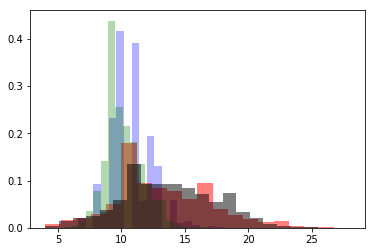

In [73]:
lowy = []
highy = []
lowx = []
highx = []
widthy = 0.0433
widthx = 0.025

for idx in range(5000):
    lowy.append(abs(np.nanmin(data[0]['PIX_Y'][idx]) - np.nanmax(data[0]['PIX_Y'][idx])) / widthy + 1)
    highy.append(abs(np.nanmin(data[1]['PIX_Y'][idx]) - np.nanmax(data[1]['PIX_Y'][idx])) / widthy + 1)
    lowx.append((abs(np.nanmin(data[0]['PIX_X'][idx]) - np.nanmax(data[0]['PIX_X'][idx])) / widthx + 1) /2 +1)
    highx.append((abs(np.nanmin(data[1]['PIX_X'][idx]) - np.nanmax(data[1]['PIX_X'][idx])) / widthx + 1) /2 +1)

plt.hist(lowy, 20, density=True,alpha=0.3,color='b')
plt.hist(highy, 20, density=True,alpha=0.5,color='r')
plt.hist(lowx, 20, density=True,alpha=0.3,color='g')
plt.hist(highx, 20, density=True,alpha=0.5,color='k')
    

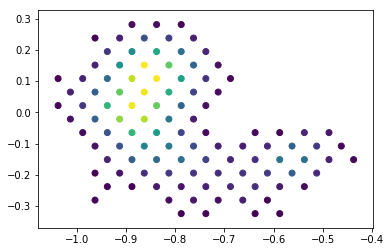

In [59]:
idx=50
plt.scatter(data[1]['PIX_X'][idx],data[1]['PIX_Y'][idx],c=data[1]['PIX_PHA'][idx])

In [50]:
abs(np.nanmin(data[1]['PIX_X'][50]) - np.nanmax(data[1]['PIX_X'][50])) / widthx + 1

32.99999999999999

In [16]:
len(data[0]['PE_PHI'][:])

5000

(array([0.20697503, 0.20697503, 0.27384389, 0.23244888, 0.27065966,
        0.36300236, 0.25792273, 0.27065966, 0.32160736, 0.27384389,
        0.29931774, 0.22608042, 0.28658081, 0.32479159, 0.27384389,
        0.28976504, 0.24518581, 0.23881734, 0.22926465, 0.24518581,
        0.27702812, 0.17831695, 0.14329041, 0.19105388, 0.17194849,
        0.08597424, 0.10826386, 0.07323732, 0.07005309, 0.06686886,
        0.02547385, 0.03502654, 0.00955269, 0.01910539, 0.01592116,
        0.00318423, 0.00636846, 0.00955269, 0.00318423, 0.03184231,
        0.02865808, 0.04139501, 0.06686886, 0.08915848, 0.09871117,
        0.08915848, 0.1018954 , 0.12418502, 0.1018954 , 0.24837004,
        0.22608042, 0.25155427, 0.23244888, 0.24200158, 0.24837004,
        0.29613351, 0.28658081, 0.27384389, 0.30250197, 0.35981813,
        0.3056862 , 0.28658081, 0.33752851, 0.29294928, 0.32797582,
        0.27702812, 0.29931774, 0.22926465, 0.24837004, 0.21334349,
        0.18150118, 0.21652773, 0.18150118, 0.15

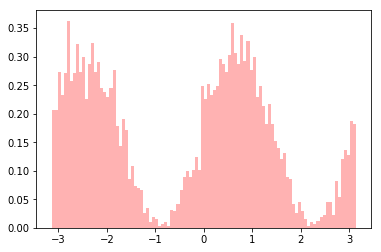

In [17]:
plt.hist(data[0]['PE_PHI'][:],100,density=True,color='r',alpha=0.3)
#plt.hist(data[1]['PE_PHI'][:],100,density=True,color='b',alpha=0.3)

In [56]:
pi_new = data[1]['PI']
pi_old = data[2]['PI']
pi_real = data[0]['PI'][:10000]

(array([2.47178051e-06, 3.29570734e-06, 0.00000000e+00, 2.47178051e-06,
        1.64785367e-06, 3.29570734e-06, 0.00000000e+00, 3.29570734e-06,
        2.47178051e-06, 4.94356101e-06, 2.47178051e-06, 8.23926835e-06,
        4.11963418e-06, 4.11963418e-06, 5.76748785e-06, 4.94356101e-06,
        5.76748785e-06, 9.06319519e-06, 4.11963418e-06, 2.47178051e-06,
        4.11963418e-06, 5.76748785e-06, 7.41534152e-06, 2.47178051e-06,
        3.29570734e-06, 1.64785367e-06, 4.94356101e-06, 4.94356101e-06,
        3.29570734e-06, 4.11963418e-06, 3.29570734e-06, 1.64785367e-06,
        2.47178051e-06, 4.94356101e-06, 4.94356101e-06, 3.29570734e-06,
        4.94356101e-06, 5.76748785e-06, 7.41534152e-06, 1.64785367e-06,
        7.41534152e-06, 4.94356101e-06, 8.23926835e-06, 1.31828294e-05,
        2.47178051e-05, 1.64785367e-05, 3.04852929e-05, 5.19073906e-05,
        6.50902200e-05, 7.66251957e-05, 9.06319519e-05, 1.18645464e-04,
        1.49130757e-04, 1.63137513e-04, 1.67257148e-04, 2.241080

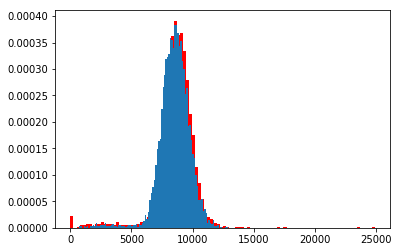

In [59]:
#plt.hist(pi_new[pi_new<25000],100,density=True)
plt.hist(pi_real[pi_real<25000],100,density=True,color='r')
plt.hist(pi_old[pi_old<25000],100,density=True)

Text(0.5,1,'0.012949004635169395,-1.1272449301016052')

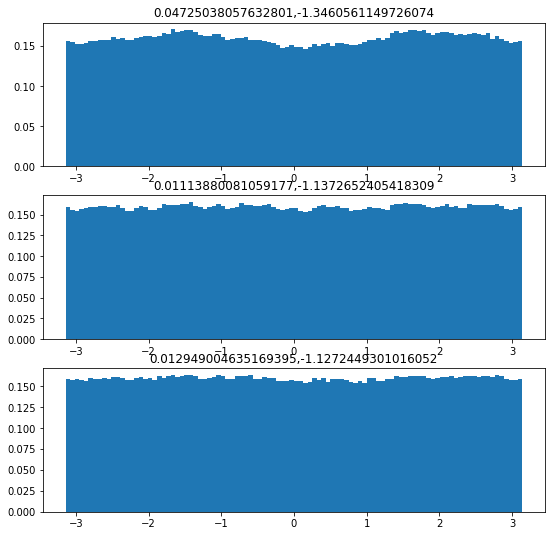

In [25]:
plt.figure(figsize=(9,9))
plt.subplot(311)
v = np.array(data[0]['TRK_PHI2'])
v = v[abs(v) < np.pi]
plt.hist(v,100,density=True)
mu = 2*np.sqrt(sum(np.cos(2*v))**2 + sum(np.sin(2*v))**2) / len(v)
phi0 = np.arctan2(sum(np.sin(2*v)),sum(np.cos(2*v)))/2
plt.title("{},{}".format(mu,phi0))

plt.subplot(312)
v = np.array(data[1]['TRK_PHI2'])
v = v[abs(v) < np.pi]
plt.hist(v,100,density=True)
mu = 2*np.sqrt(sum(np.cos(2*v))**2 + sum(np.sin(2*v))**2) / len(v)
phi0 = np.arctan2(sum(np.sin(2*v)),sum(np.cos(2*v)))/2
plt.title("{},{}".format(mu,phi0))

plt.subplot(313)
v = np.array(data[2]['DETPHI'])
v = v[abs(v) < np.pi]
plt.hist(v,100,density=True)
mu = 2*np.sqrt(sum(np.cos(2*v))**2 + sum(np.sin(2*v))**2) / len(v)
phi0 = np.arctan2(sum(np.sin(2*v)),sum(np.cos(2*v)))/2
plt.title("{},{}".format(mu,phi0))

In [2]:
real = torch.load("/home/users/alpv95/khome/tracksml/data/expanded/recon/meas6p4_ROB/train/data_full.pt")
sim = torch.load("/home/users/alpv95/khome/tracksml/data/expanded/pulse_normROB/train/data_full.pt")

In [53]:
idx = torch.nonzero(real[0].reshape(-1))
print(torch.min(real[0].reshape(-1)[idx]*rescale[0] - rescale[1]))

idx = torch.nonzero(sim[0].reshape(-1))
print(torch.min(sim[0].reshape(-1)[idx]))

tensor(4.7860, dtype=torch.float64)
tensor(21., dtype=torch.float64)


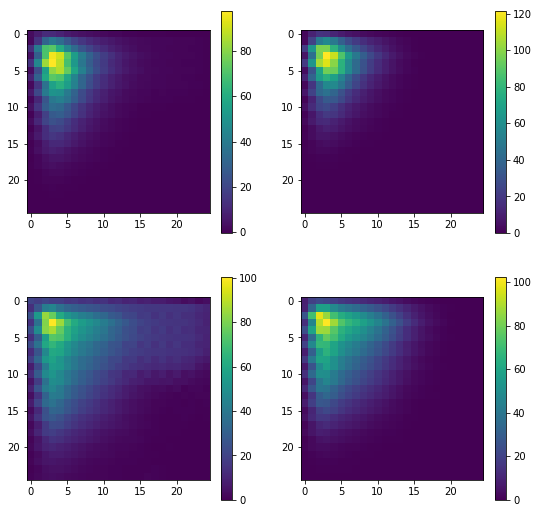

In [8]:
plt.figure(figsize=(9,9))
plt.subplot(221)
plt.imshow(torch.mean(real[0].reshape(-1,25,25)*rescale[0] - rescale[1],0))
plt.colorbar()
plt.subplot(222)
plt.imshow(torch.mean(sim[0].reshape(-1,25,25),0))
plt.colorbar()
plt.subplot(223)
plt.imshow(torch.std(real[0].reshape(-1,25,25)*rescale[0] - rescale[1],0))
plt.colorbar()
plt.subplot(224)
plt.imshow(torch.std(sim[0].reshape(-1,25,25),0))
plt.colorbar()

In [4]:
y = np.ndarray.flatten( np.stack( (np.ndarray.flatten(torch.std(sim[0].reshape(-1,25,25),0).numpy()),
    np.ndarray.flatten(torch.mean(sim[0].reshape(-1,25,25),0).numpy()) ), axis=1) )

In [5]:
X = np.ndarray.flatten( np.stack( (np.ndarray.flatten(torch.std(real[0].reshape(-1,25,25),0).numpy()),
    np.ndarray.flatten(torch.mean(real[0].reshape(-1,25,25),0).numpy()) ), axis=1) )
col2 = np.empty((len(X),))
col2[::2] = 0
col2[1::2] = -1
X = np.stack((X, col2),1)
X.shape

(1250, 2)

In [6]:

rescale, _, _, _ = np.linalg.lstsq(X, y)


/home/users/alpv95/.local/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  


In [7]:
rescale

array([0.64036582, 0.41126814])

(array([1.11423530e-05, 0.00000000e+00, 1.59176472e-06, 9.55058831e-06,
        1.75094119e-05, 2.86517649e-05, 2.22847061e-05, 2.06929413e-05,
        3.18352944e-05, 3.02435297e-05, 2.54682355e-05, 2.38764708e-05,
        1.43258825e-05, 2.06929413e-05, 1.91011766e-05, 1.11423530e-05,
        2.38764708e-05, 1.91011766e-05, 2.38764708e-05, 2.22847061e-05,
        1.59176472e-05, 1.43258825e-05, 1.59176472e-05, 1.91011766e-05,
        1.75094119e-05, 1.91011766e-05, 2.70600002e-05, 1.91011766e-05,
        2.38764708e-05, 1.75094119e-05, 1.43258825e-05, 1.75094119e-05,
        2.22847061e-05, 1.75094119e-05, 3.02435297e-05, 3.34270591e-05,
        3.02435297e-05, 3.34270591e-05, 3.02435297e-05, 4.29776474e-05,
        3.18352944e-05, 4.13858827e-05, 4.61611768e-05, 5.57117652e-05,
        4.29776474e-05, 6.04870593e-05, 5.57117652e-05, 4.93447063e-05,
        4.77529416e-05, 5.25282357e-05, 4.77529416e-05, 5.57117652e-05,
        7.48129418e-05, 6.84458829e-05, 5.57117652e-05, 7.322117

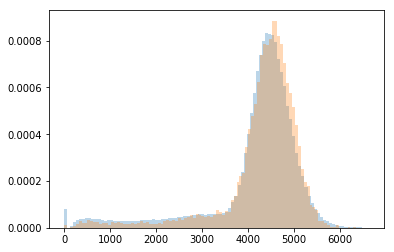

In [40]:
plt.hist(data[0]['PI'][data[0]['PI'] < 30000] * rescale[0],100,density=True,alpha=0.3)
plt.hist(data[1]['PI'][data[1]['PI'] < 30000],100,density=True,alpha=0.3)

In [49]:
tracks_x = data[0]['PIX_X']
tracks_y = data[0]['PIX_Y']
tracks_pha = data[0]['PIX_PHA']
abs_x = data[0]['DETX']
abs_y = data[0]['DETY']
phi = data[0]['DETPHI']

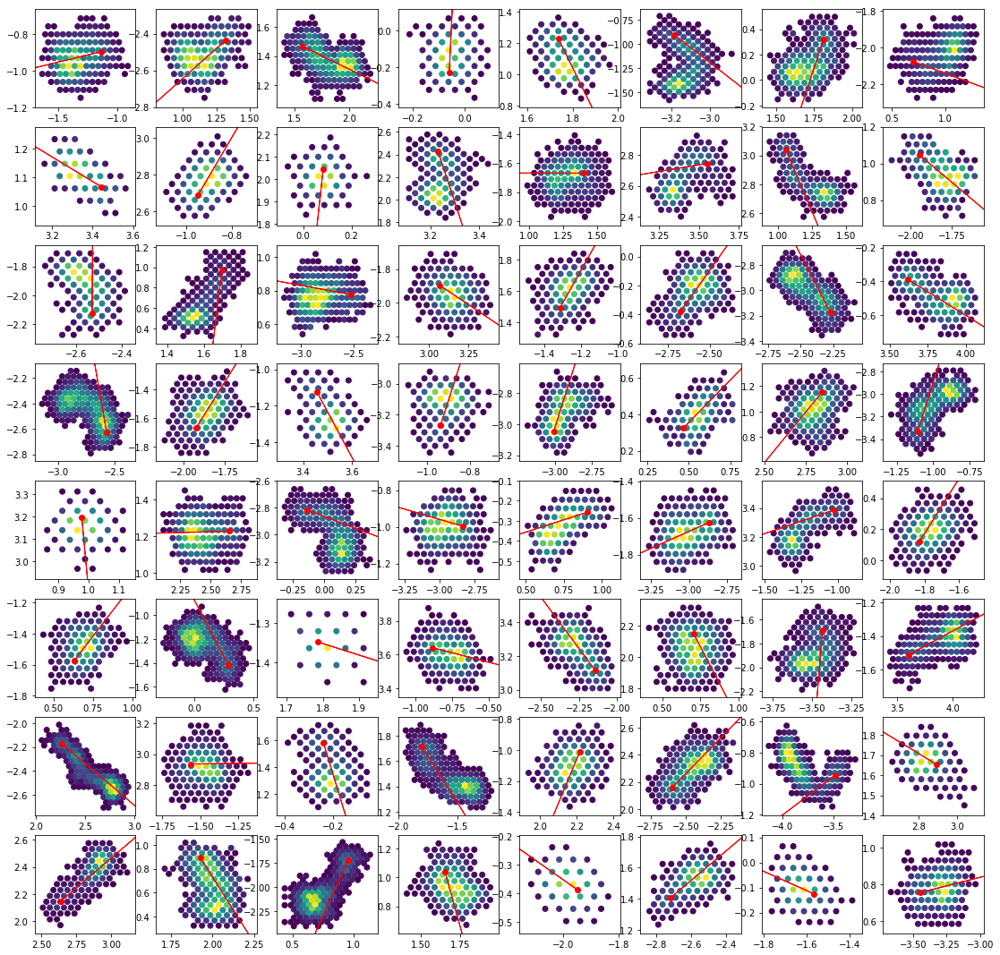

In [50]:
plt.figure(figsize=(19,19))
for i in range(1,65):
    plt.subplot(8,8,i)
    plt.scatter(tracks_x[i],tracks_y[i],c=tracks_pha[i], cmap='viridis')
    plt.scatter(abs_x[i],abs_y[i],c='r',)
    plt.arrow(abs_x[i],abs_y[i],10 * np.cos(phi[i]), 10 * np.sin(phi[i]),color='r')

In [2]:
data_dir = home_dir + "data/5.9keV_Unpol/104_0004057_data_recon.fits"
#home_dir +"data/GPD_EM_data/GPD_EM_6p4keV/109_0000223_data_recon.fits"
#home_dir + "data/3.7keV_Unpol/104_0004050/104_0004050_data_recon.fits"
#home_dir + "data/5.9keV_Unpol/104_0004057_data_recon.fits"
#home_dir + "data/gen2a/gen2_ang120_3p7_recon.fits"
#home_dir +"data/Reconstruction_Optimization_Benchmark/Measures/3p7keV_pol/xpol_2769_recon.fits"
with fits.open(data_dir, memmap=False) as hdu:
    hdu.info()
    print(hdu[1].columns)
    #print(hdu[3].columns)
    #data3 = hdu[3].data
    data = hdu[1].data
    #data2 = hdu[2].data

Filename: /home/groups/kipac/alpv95/tracksml/data/5.9keV_Unpol/104_0004057_data_recon.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      39   ()      
  1  EVENTS        1 BinTableHDU    163   250000R x 38C   [1J, 1J, 1K, 1J, 1D, 1J, 1I, 1I, 1I, 1I, 1J, 1I, 1I, 1I, 1I, 1I, 1I, 1D, 1D, 1I, 1I, 1J, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 200D, 200D, 200D, 200I]   
  2  GTI           1 BinTableHDU     33   1R x 2C   [1D, 1D]   
ColDefs(
    name = 'PAKTNUMB'; format = '1J'
    name = 'TRG_ID'; format = '1J'
    name = 'SEC'; format = '1K'
    name = 'MICROSEC'; format = '1J'
    name = 'TIME'; format = '1D'
    name = 'LIVETIME'; format = '1J'
    name = 'MIN_COL'; format = '1I'
    name = 'MAX_COL'; format = '1I'
    name = 'MIN_ROW'; format = '1I'
    name = 'MAX_ROW'; format = '1I'
    name = 'ROI_SIZE'; format = '1J'
    name = 'ERR_SUM'; format = '1I'; bscale = 1; bzero = 32768
    name = 'DU_STATUS'; format = '1I'; bscale 

In [51]:
cut = (data2['NUM_CLU'] > 0)*(data2['LIVETIME'] > -1)*(abs(data2['BARX']) < 6.3)*(abs(data2['BARY']) < 6.3) * (data2['TRK_M2L'] / data2['TRK_M2T'] > 5)

med = np.median(data2['PI'])
dev = stats.median_absolute_deviation(data2['PI'])
cut *= (data2['PI'] > med - 3*dev) * (data2['PI'] < med + 3*dev)

In [57]:
tracks_x = data2['PIX_X'][cut]
tracks_y = data2['PIX_Y'][cut]
tracks_pha = data2['PIX_PHA'][cut]
abs_x = data2['DETX'][cut]
abs_y = data2['DETY'][cut]
phi = data2['DETPHI'][cut]

In [53]:
len(tracks_x)

79115

In [ ]:
for i in range(len(tracks_x)):
    plt.scatter(tracks_x[i],tracks_y[i],c=tracks_pha[i], cmap='viridis')

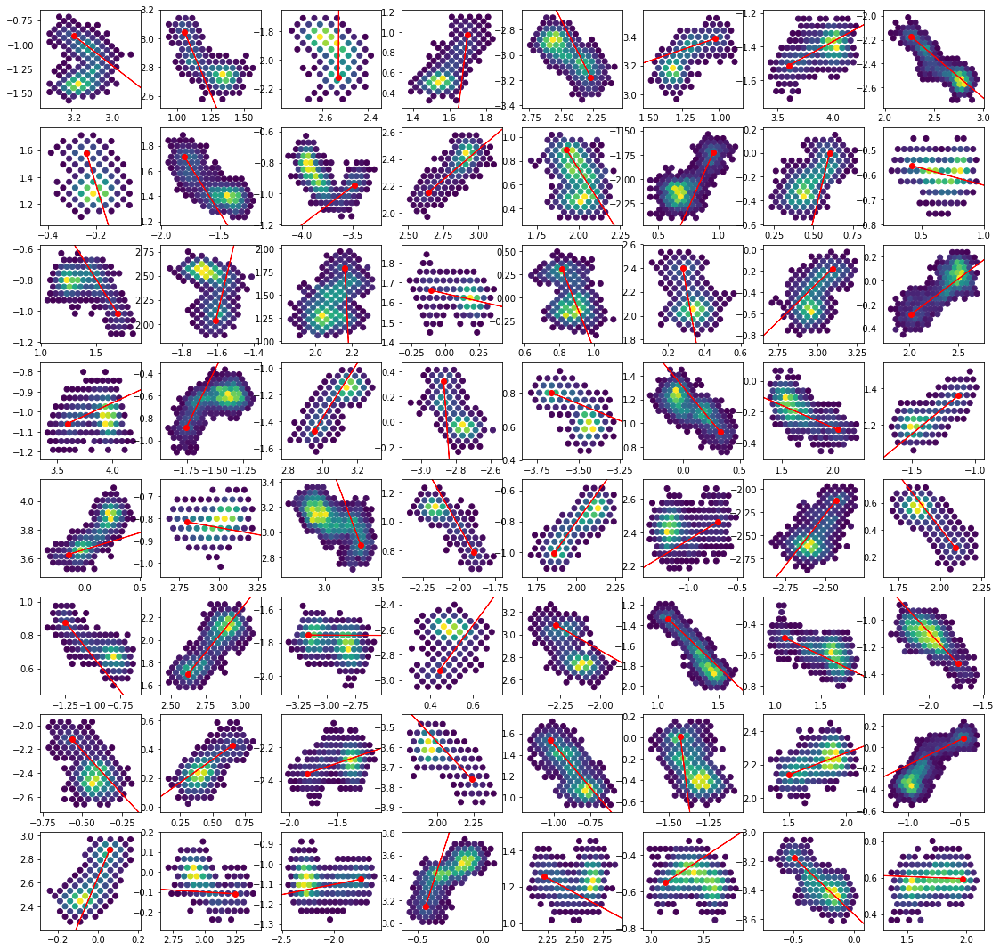

In [58]:
plt.figure(figsize=(19,19))
for i in range(1,65):
    plt.subplot(8,8,i)
    plt.scatter(tracks_x[i],tracks_y[i],c=tracks_pha[i], cmap='viridis')
    plt.scatter(abs_x[i],abs_y[i],c='r',)
    plt.arrow(abs_x[i],abs_y[i],10 * np.cos(phi[i]), 10 * np.sin(phi[i]),color='r')

(array([0.01404599, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.06601615, 0.09551272, 0.10955871,
        0.09270352, 0.09691732, 0.1250093 , 0.11096331, 0.14888748,
        0.1250093 , 0.14326908, 0.15591047, 0.15450587, 0.18821624,
        0.18962084, 0.21490362, 0.20507143, 0.23175881, 0.22192662,
        0.18259785, 0.22473581, 0.21349902, 0.23456801, 0.25001859,
        0.20507143, 0.22333122, 0.23175881, 0.20226223, 0.19664384,
        0.18259785, 0.17978865, 0.20647603, 0.15169667, 0.15450587,
        0.18681165, 0.15871967, 0.1222001 , 0.1193909 , 0.1222001 ,
        0.10955871, 0.09972652, 0.08146673, 0.1151771 , 0.09832192,
        0.08989433, 0.09129892, 0.08989433, 0.10674951, 0.09691732,
        0.1193909 , 0.1250093 , 0.13765069, 0.1207955 , 0.11236791,
        0.14186448, 0.14467368, 0.17417026, 0.18962084, 0.17557485,
        0.19383464, 0.19945303, 0.18259785, 0.17

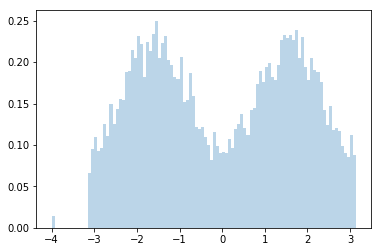

In [35]:
plt.hist(data2['PI'],bins=100,density=True,alpha=0.3)

(array([2.81154583e-06, 1.68692750e-06, 1.76565078e-05, 3.29513171e-05,
        4.36351912e-05, 5.29695234e-05, 5.26321379e-05, 5.15075195e-05,
        4.76838172e-05, 3.38510117e-05, 3.78996377e-05, 3.67750194e-05,
        3.37385499e-05, 3.59877866e-05, 3.50880919e-05, 3.16017751e-05,
        3.03646949e-05, 2.89026911e-05, 3.04771568e-05, 3.25014698e-05,
        3.38510117e-05, 2.90151529e-05, 3.41883972e-05, 3.14893133e-05,
        3.17142369e-05, 3.69999431e-05, 4.07111836e-05, 3.82370232e-05,
        3.92491797e-05, 3.94741034e-05, 4.14984164e-05, 4.53221187e-05,
        4.37476531e-05, 5.29695234e-05, 5.45439890e-05, 5.54436837e-05,
        6.02795425e-05, 6.00546188e-05, 5.73555349e-05, 5.93798478e-05,
        5.89300005e-05, 6.07293898e-05, 6.37658593e-05, 7.81609740e-05,
        9.77293329e-05, 1.45750536e-04, 2.22449506e-04, 3.31312560e-04,
        4.69078306e-04, 5.92448936e-04, 7.41011018e-04, 8.58083786e-04,
        8.92722031e-04, 8.79901382e-04, 8.12649206e-04, 7.059229

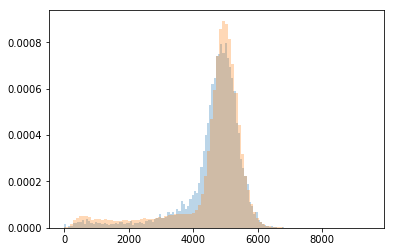

In [32]:
plt.hist(data['PI'],bins=100,density=True,alpha=0.3)
plt.hist(data2['PI'][data2['PI']<15000]*0.63,bins=100,density=True,alpha=0.3)

In [22]:
med = np.median(data_real2['PI'])
dev = stats.median_absolute_deviation(data_real2['PI'])
stats.median_absolute_deviation(data['PI'])

363.0

In [23]:
med = np.median(data_real2['PI'])
dev = stats.median_absolute_deviation(data_real2['PI'])

### Pulse Height cut below, within 3 sigma of peak


In [25]:
cut = (data_real2['PI'] > med - 3*dev) * (data_real2['PI'] < med + 3*dev)
print(data_real2['PI'][cut].shape[0]/data_real2['PI'].shape[0])
print(data_real2['PI'][cut].shape)

0.8201918752810673
(32829,)


In [46]:
factor = np.median(data['PI']) / np.median(data_real['PI'])

In [47]:
factor

0.6189683860232945

In [58]:
tracks = torch.load(home_dir +"data/expanded/recon/meas6p4_ROB/train/data_full.pt")

In [77]:
sim = torch.load(home_dir +"data/expanded/pulse_norm/train/data_full.pt")

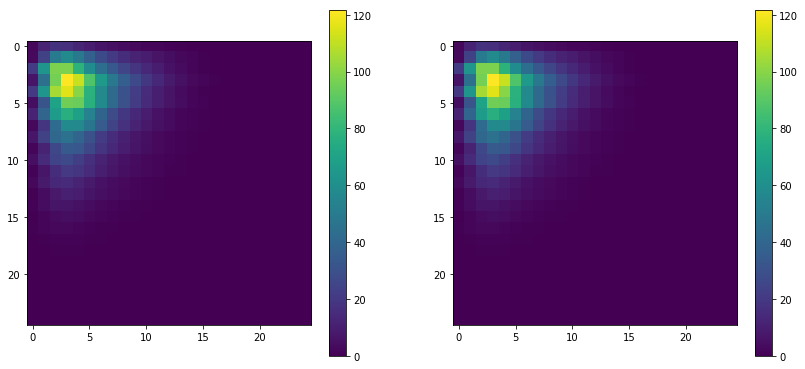

In [110]:
plt.figure(figsize=(14,14))
plt.subplot(221)
plt.imshow(torch.mean(test,(0,1)))
plt.colorbar()

plt.subplot(222)
plt.imshow(torch.mean(sim[0],(0,1)))
plt.colorbar()


In [107]:
tracks[0].shape

torch.Size([76338, 1, 25, 25])

In [108]:
test = torch.where( np.isfinite(rescale), tracks[0] * rescale, tracks[0])

In [111]:
rescale = torch.mean(sim[0],(0,1,2,3)) / torch.mean(tracks[0],(0,1,2,3))

In [113]:
rescale_std = torch.squeeze(torch.std(sim[0].reshape(-1),0)) / torch.squeeze(torch.std(tracks[0].reshape(-1) , 0) )

In [114]:
rescale_std

tensor(0.6640, dtype=torch.float64)

In [93]:
rescale_std = torch.squeeze(torch.std(sim[0].reshape((-1,25,25)),0)) / torch.squeeze(torch.std(tracks[0] , 0) )

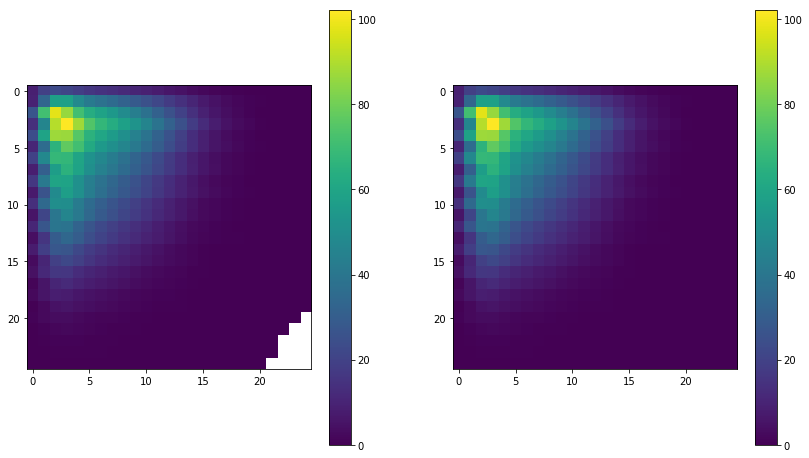

In [94]:
plt.figure(figsize=(14,8))
plt.subplot(121)
plt.imshow(torch.squeeze(torch.std(tracks[0] * rescale_std , 0) ) )
plt.colorbar()

plt.subplot(122)
plt.imshow(torch.squeeze(torch.std(sim[0].reshape((-1,25,25)),0)))
plt.colorbar()


In [38]:
pha = torch.sum(tracks[0],(1,2,3))

In [42]:
pha.int().float()

tensor([3980., 4423., 3662.,  ..., 4288., 4768., 3930.])

In [25]:
PI = [sum(track[track>0]) for track in data['PIX_PHA']]
PI_real = [sum(track[track>0]) * factor for track in data_real['PIX_PHA']]

(array([0.00000000e+00, 1.24879283e-06, 7.65926271e-06, 1.82740018e-05,
        2.75566952e-05, 3.41752972e-05, 3.38006594e-05, 3.63814979e-05,
        3.31762629e-05, 3.20523494e-05, 3.09284358e-05, 2.99294016e-05,
        2.93050052e-05, 3.05121716e-05, 2.67657931e-05, 2.59332645e-05,
        2.74318159e-05, 2.78480802e-05, 3.11781944e-05, 4.00029971e-05,
        5.31153219e-05, 8.86226648e-05, 1.70793233e-04, 3.17235006e-04,
        5.81188185e-04, 8.91887842e-04, 1.17811116e-03, 1.34232742e-03,
        1.32534383e-03, 1.13407040e-03, 8.66287589e-04, 5.88764195e-04,
        3.71807253e-04, 2.17081821e-04, 1.21465916e-04, 6.55199973e-05,
        3.79633021e-05, 2.01471910e-05, 1.15721469e-05, 7.24299843e-06,
        3.91288421e-06, 2.62246495e-06, 2.12294782e-06, 1.24879283e-06,
        1.24879283e-06, 1.24879283e-06, 1.29041926e-06, 1.08228712e-06,
        8.74154984e-07, 1.12391355e-06, 1.33204569e-06, 1.66505711e-06,
        1.58180426e-06, 1.62343068e-06, 2.08132139e-06, 2.039694

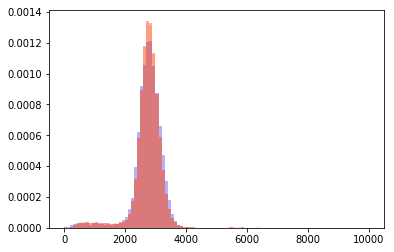

In [40]:
plt.hist(PI,100,range=(0,10000),density=True,color='b',alpha=0.3)
plt.hist(PI_real,100,range=(0,10000),density=True,color='orange',alpha=0.3)
plt.hist(pha*factor,100,range=(0,10000),density=True,color='r',alpha=0.3)

In [57]:
(-np.median(data['PI']) + np.median(data_real['PI']))

2977.0

(array([2.09681624e-05, 2.28949665e-05, 1.90413583e-05, 2.34616736e-05,
        2.14215281e-05, 2.09681624e-05, 2.36883564e-05, 1.98347482e-05,
        2.45950878e-05, 2.90154031e-05, 2.53884777e-05, 2.58418434e-05,
        2.74286232e-05, 2.53884777e-05, 2.78819889e-05, 2.65218919e-05,
        3.02621587e-05, 2.98087930e-05, 2.58418434e-05, 3.28690113e-05,
        3.59292296e-05, 3.58158882e-05, 3.84227408e-05, 3.78560337e-05,
        4.09162520e-05, 3.86494237e-05, 4.19363248e-05, 3.72893266e-05,
        3.94428136e-05, 3.85360822e-05, 4.22763490e-05, 3.70626438e-05,
        4.31830804e-05, 4.00095207e-05, 4.80567614e-05, 5.13436625e-05,
        6.26778044e-05, 7.42386290e-05, 1.02120618e-04, 1.29549241e-04,
        1.77606003e-04, 2.26909520e-04, 2.88227227e-04, 3.51358397e-04,
        4.06555668e-04, 4.74333836e-04, 5.24544084e-04, 5.89262034e-04,
        5.90848814e-04, 6.15217219e-04, 5.84275012e-04, 5.63646873e-04,
        5.22390597e-04, 4.69120131e-04, 4.10862642e-04, 3.541919

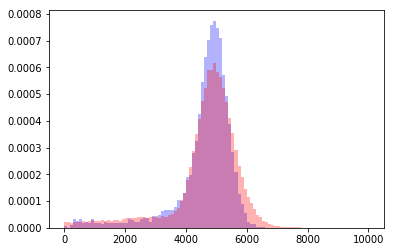

In [56]:
plt.hist(data['PI'],100,range=(0,10000),density=True, alpha=0.3,color='b')
plt.hist((data_real['PI'] - (-np.median(data['PI']) + np.median(data_real['PI']))),100,range=(0,10000),density=True, alpha=0.3,color='r')
#plt.hist(data_real2['PI'],100,range=(0,10000),density=True)

In [21]:


data_dir = home_dir +"data/Reconstruction_Optimization_Benchmark/Measures/6p4keV_pol/xpol_2747_recon.fits"
with fits.open(data_dir, memmap=False) as hdu:
    print(hdu[1].columns)
    data = hdu[1].data
    n_tracks = data.size
    
    X = data['PHI2']/data['PHI1']
    
    
    min_cols = data['MIN_COL'][:n_tracks]
    max_cols = data['MAX_COL'][:n_tracks]
    min_rows = data['MIN_ROW'][:n_tracks]
    max_rows = data['MAX_ROW'][:n_tracks]
    rois = np.column_stack((min_cols, max_cols, min_rows, max_rows))

    tracks_x = [data['PIX_X'][i] for i in range(n_tracks)]
    tracks_y = [data['PIX_Y'][i] for i in range(n_tracks)]
    tracks_inv = [data['PIX_INV'][i] for i in range(n_tracks)]
    tracks_adc = [data['PIX_PHA'][i] for i in range(n_tracks)]
    
    tracks_dphi = [data['DETPHI'][i] for i in range(n_tracks)]
    tracks_phi2 = [data['PHI2'][i] for i in range(n_tracks)]
    tracks_phi1 = [data['PHI1'][i] for i in range(n_tracks)]
    #raw_tracks = RoiHexTracks(tracks[0:70], rois)
    #hex_tracks = convert_hex_tracks(raw_tracks, pixel_cutoff=0)
print(n_tracks)

ColDefs(
    name = 'PAKTNUMB'; format = '1J'
    name = 'TRG_ID'; format = '1J'
    name = 'SEC'; format = '1K'
    name = 'MICROSEC'; format = '1J'
    name = 'TIME'; format = '1D'
    name = 'LIVETIME'; format = '1J'
    name = 'MIN_COL'; format = '1I'
    name = 'MAX_COL'; format = '1I'
    name = 'MIN_ROW'; format = '1I'
    name = 'MAX_ROW'; format = '1I'
    name = 'ROI_SIZE'; format = '1J'
    name = 'ERR_SUM'; format = '1I'; bscale = 1; bzero = 32768
    name = 'DU_STATUS'; format = '1I'; bscale = 1; bzero = 32768
    name = 'DSU_STATUS'; format = '1I'; bscale = 1; bzero = 32768
    name = 'STATUS'; format = '1I'; bscale = 1; bzero = 32768
    name = 'NUM_CLU'; format = '1I'
    name = 'NUM_PIX'; format = '1I'
    name = 'EVT_FRA'; format = '1D'
    name = 'SN'; format = '1D'
    name = 'TRK_SIZE'; format = '1I'; unit = 'pixels'
    name = 'TRK_BORD'; format = '1I'; unit = 'pixels'
    name = 'PHA'; format = '1J'; unit = 'ADC counts'
    name = 'PI'; format = '1D'
    name = '

/home/users/alpv95/.local/lib/python3.6/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':


95987


In [44]:
tracks_X = np.array(tracks_x)
tracks_X = (tracks_x - np.nanmin(tracks_x))/0.025
ranx = [np.nanmax(track) - np.nanmin(track) for track in tracks_X]

tracks_Y = np.array(tracks_y)
tracks_Y = (tracks_y - np.nanmin(tracks_y))/0.043299999
rany = [np.nanmax(track) - np.nanmin(track) for track in tracks_Y]



(array([2.6000e+01, 1.9490e+03, 8.4660e+03, 1.4132e+04, 2.6257e+04,
        1.9519e+04, 9.7410e+03, 8.1200e+03, 3.9440e+03, 1.5980e+03,
        6.2800e+02, 5.4300e+02, 4.5100e+02, 2.8900e+02, 1.7000e+02,
        9.8000e+01, 2.9000e+01, 2.0000e+00, 1.4000e+01, 4.0000e+00,
        2.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 2.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.00

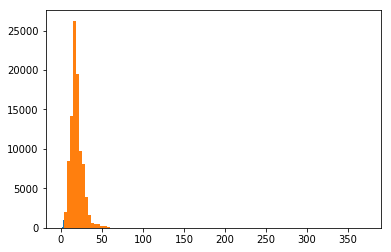

In [47]:
plt.hist(rany, bins=100)
plt.hist(ranx, bins=100)


array([-0.5125, -0.6375, -0.5875, -0.5375, -0.4875, -0.6625, -0.6125,
       -0.5625, -0.5125, -0.4625, -0.7375, -0.6875, -0.6375, -0.5875,
       -0.5375, -0.4875, -0.4375, -0.7125, -0.6625, -0.6125, -0.5625,
       -0.5125, -0.4625, -0.4125, -0.7375, -0.6875, -0.6375, -0.5875,
       -0.5375, -0.4875, -0.4375, -0.3875, -0.7125, -0.6625, -0.6125,
       -0.5625, -0.5125, -0.4625, -0.4125, -0.3625, -0.6875, -0.6375,
       -0.5875, -0.5375, -0.4875, -0.4375, -0.3875, -0.3375, -0.2875,
       -0.2375, -0.1875, -0.1375, -0.7125, -0.6625, -0.6125, -0.5625,
       -0.5125, -0.4625, -0.4125, -0.3625, -0.3125, -0.2625, -0.2125,
       -0.1625, -0.1125, -0.5375, -0.4875, -0.4375, -0.3875, -0.3375,
       -0.2875, -0.2375, -0.1875, -0.1375, -0.0875, -0.0375, -0.4625,
       -0.4125, -0.3625, -0.3125, -0.2625, -0.2125, -0.1625, -0.1125,
       -0.0625, -0.0125, -0.4375, -0.3875, -0.3375, -0.2875, -0.2375,
       -0.1875, -0.1375, -0.0875, -0.0375, -0.4125, -0.3625, -0.3125,
       -0.2625, -0.2

In [20]:
tracks_X[:100]

array([297., 299., 301., 303., 305., 309., 311., 317., 319., 321., 325.,
       298., 300., 302., 304., 306., 308., 310., 312., 314., 316., 318.,
       320., 324., 326., 295., 299., 301., 303., 305., 311., 313., 315.,
       317., 319., 321., 323., 325., 292., 296., 298., 300., 302., 304.,
       306., 308., 310., 314., 318., 320., 324., 293., 295., 297., 299.,
       301., 303., 305., 309., 315., 317., 319., 321., 323., 292., 294.,
       296., 300., 302., 304., 306., 308., 310., 314., 316., 318., 320.,
       322., 324., 295., 305., 307., 309., 311., 313., 315., 317., 321.,
       292., 294., 296., 298., 300., 304., 306., 308., 312., 316., 318.,
       293.])

In [18]:
print(-0.1875 +0.16249999999999964 )
print(-0.08750000000000036 + 0.0625)

-0.025000000000000355
-0.025000000000000355


In [17]:
set(tracks_x[:100])

{-0.1875,
 -0.16249999999999964,
 -0.13750000000000018,
 -0.11249999999999982,
 -0.08750000000000036,
 -0.0625,
 -0.037499999999999645,
 -0.012500000000000178,
 0.012500000000000178,
 0.037499999999999645,
 0.0625,
 0.08750000000000036,
 0.11249999999999982,
 0.13750000000000018,
 0.16249999999999964,
 0.1875,
 0.21250000000000036,
 0.23749999999999982,
 0.2625000000000002,
 0.28749999999999964,
 0.3125,
 0.33750000000000036,
 0.3624999999999998,
 0.3875000000000002,
 0.41249999999999964,
 0.4375,
 0.46250000000000036,
 0.4874999999999998,
 0.5125000000000002,
 0.5374999999999996,
 0.5625,
 0.5875000000000004,
 0.6125000000000007,
 0.6374999999999993,
 0.6624999999999996}

(array([649.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0., 787., 870., 809., 818., 807., 870., 842., 861., 794.,
        856., 823., 841., 863., 854., 834., 825., 832., 840., 817., 828.,
        850., 823., 841., 827., 847., 846., 856., 856., 873., 885., 879.,
        861., 849., 876., 851., 823., 876., 864., 882., 854., 801., 843.,
        857., 908., 833., 831., 905., 833., 859., 877., 863., 865., 872.,
        842., 837., 858., 925., 806., 906., 834., 882., 844., 869., 857.,
        865., 887., 852., 827., 852., 861., 838., 877., 881., 873., 811.,
        807., 812., 855., 849., 839., 853., 843., 877., 890., 837., 843.,
        812., 808., 802., 830., 836., 842., 919., 851., 833., 796., 880.,
        764., 810., 873., 853., 848., 906., 817., 806., 850., 784., 765.,
        782., 826., 816., 839., 809., 872., 877., 874., 811., 848., 841.,
        808., 876., 829., 865., 824., 

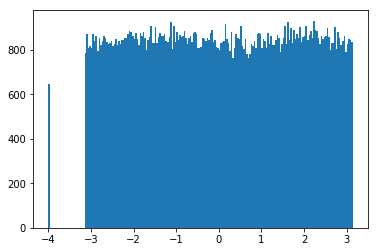

In [111]:
plt.hist(tracks_phi2, 200)

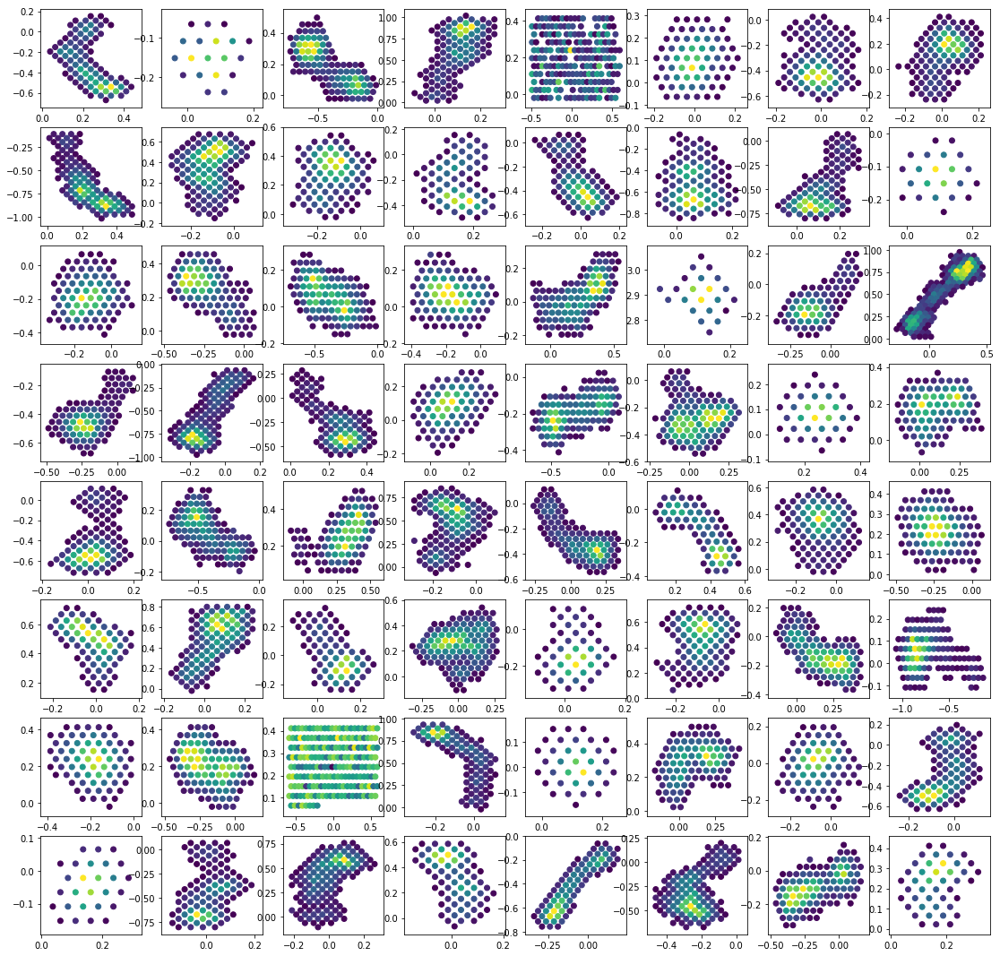

In [15]:
plt.figure(figsize=(19,19))
for i in range(1,65):
    plt.subplot(8,8,i)
    plt.scatter(tracks_x[i],tracks_y[i],c=tracks_adc[i], cmap='viridis')

In [20]:
hex_tracks.Q[0]

array([79, 14,  7, ..., -1, -1, -1], dtype=int16)

In [2]:
from astropy.io import fits
data_dir = home_dir +"data/gen2b/gen2_ang30_6p6.fits"
with fits.open(data_dir, memmap=False) as hdu:
    hdu.info()
    print(hdu[1].columns)
    print(hdu[2].columns)
    data = hdu[1].data
    data2 = hdu[2].data

Filename: /home/groups/kipac/alpv95/tracksml/data/gen2b/gen2_ang30_6p6.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      37   ()      
  1  EVENTS        1 BinTableHDU     74   9706R x 12C   [1J, 1J, 1K, 1J, 1D, 1I, 1I, 1I, 1I, 1J, 1J, QI(22680)]   
  2  GTI           1 BinTableHDU     33   1R x 2C   [1D, 1D]   
  3  MONTE_CARLO    1 BinTableHDU     80   9706R x 18C   [1D, 1D, 1D, 1D, 1A, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1J, PD(305), PD(305), PD(305), PL(0)]   
ColDefs(
    name = 'PAKTNUMB'; format = '1J'
    name = 'TRG_ID'; format = '1J'
    name = 'SEC'; format = '1K'
    name = 'MICROSEC'; format = '1J'
    name = 'TIME'; format = '1D'
    name = 'MIN_COL'; format = '1I'
    name = 'MAX_COL'; format = '1I'
    name = 'MIN_ROW'; format = '1I'
    name = 'MAX_ROW'; format = '1I'
    name = 'ROI_SIZE'; format = '1J'
    name = 'ERR_SUM'; format = '1J'
    name = 'PIX_PHAS'; format = 'QI(22680)'
)
ColDefs(
    name = 'START'; format

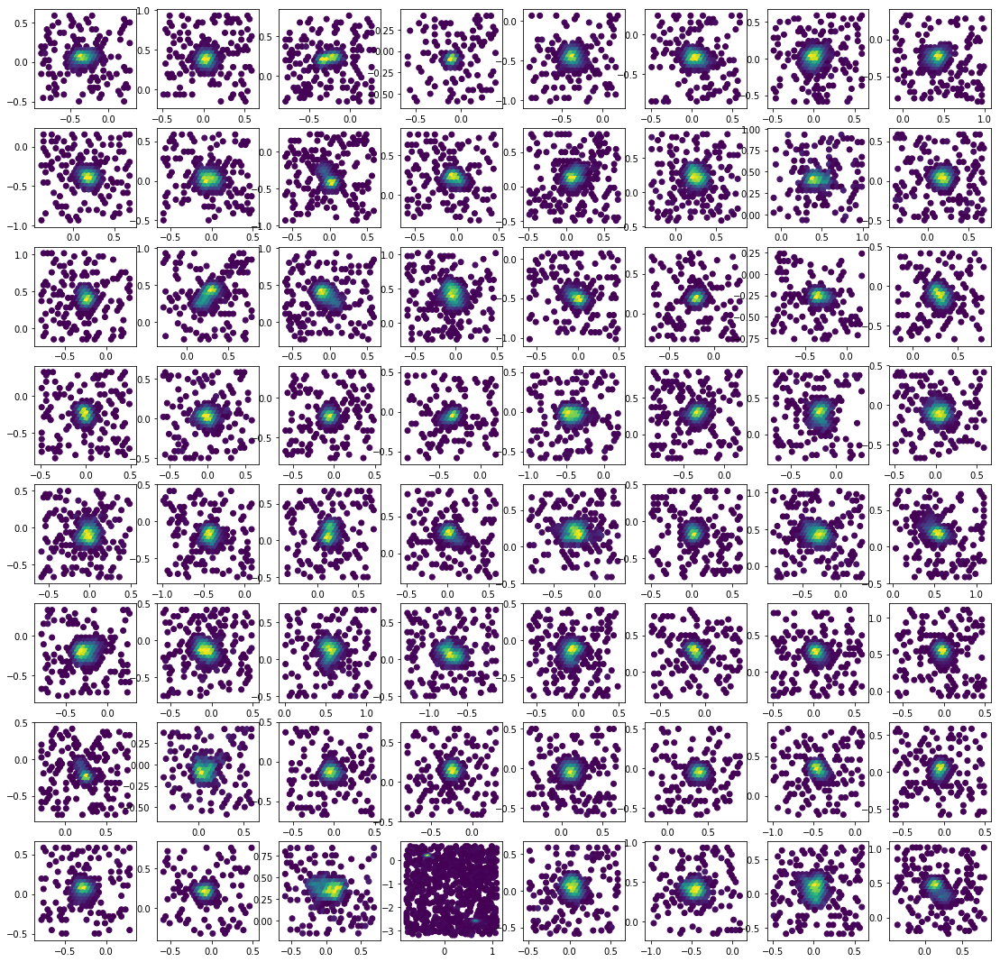

In [55]:
data_dir = home_dir +'data/converted/gen2a/gen2a_3p7_ang135_pol_sim_sparse_hex_tracks.h5'
plt.figure(figsize=(19,19))
with h5py.File(data_dir, 'r') as f:
    for i in range(1,65):
        plt.subplot(8,8,i)
        plt.scatter(f['x'][i+300],f['y'][i+300],c=f['Q'][i+300], cmap='viridis')

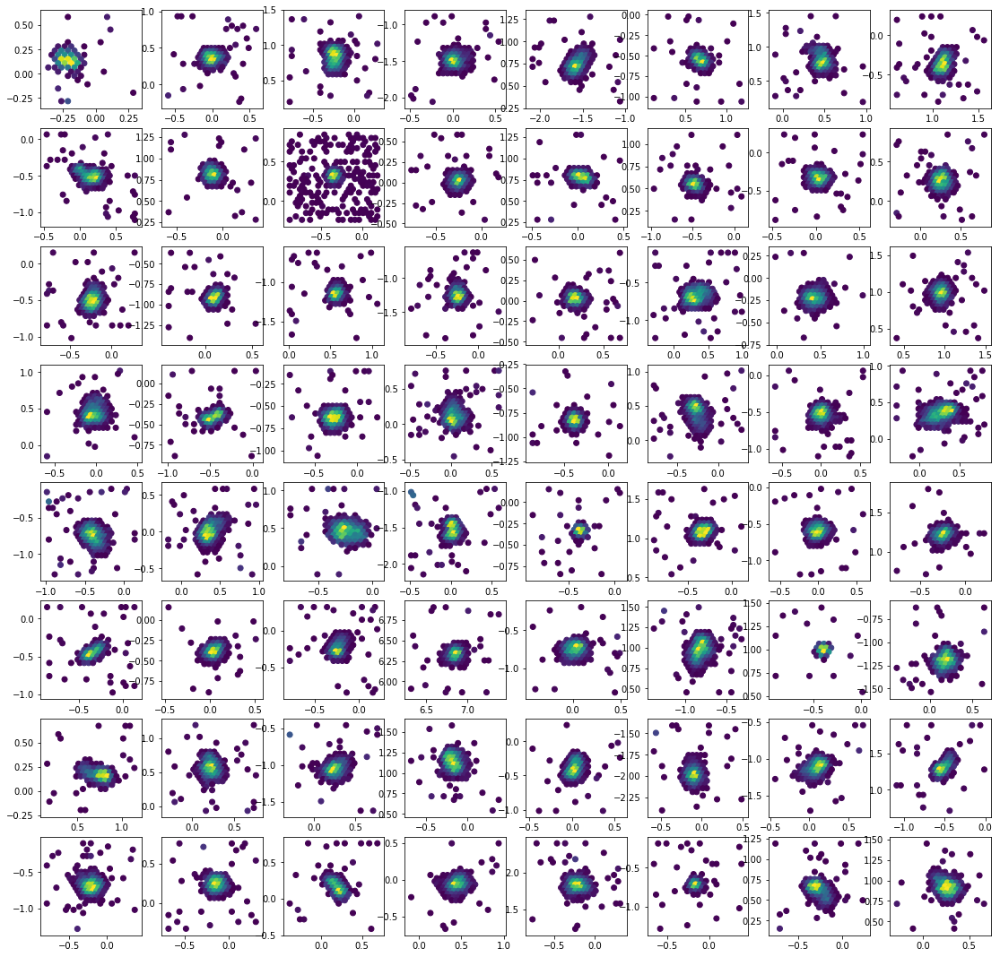

In [7]:
data_dir = home_dir +'data/converted/set1_3p7_pol_meas_sparse_hex_tracks.h5'
plt.figure(figsize=(19,19))
with h5py.File(data_dir, 'r') as f:
    for i in range(1,65):
        plt.subplot(8,8,i)
        plt.scatter(f['x'][i+300],f['y'][i+300],c=f['Q'][i+300], cmap='viridis')

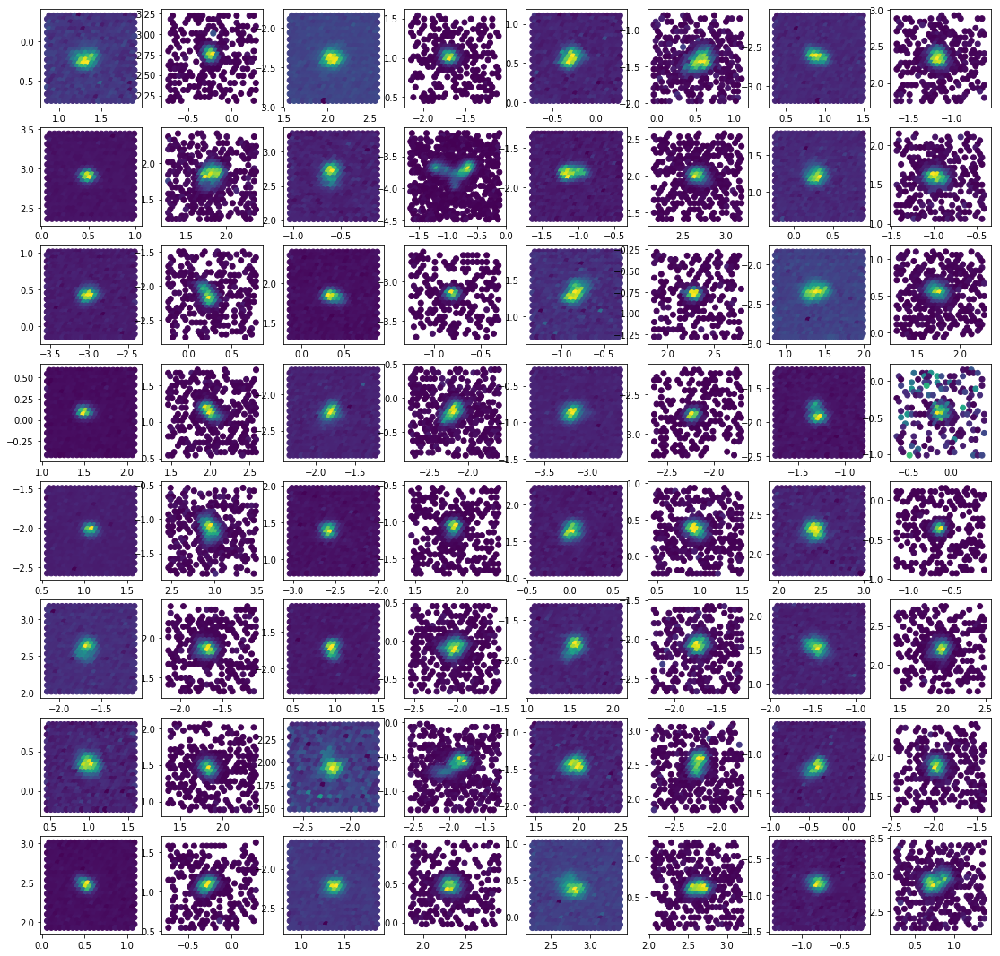

In [15]:
data_dir = home_dir +'data/converted/fabio_unpolarized/Unpol_3p7_ang0_pol_meas_sparse_hex_tracks_100000.h5'
plt.figure(figsize=(19,19))
with h5py.File(data_dir, 'r') as f:
    for i in range(1,65):
        plt.subplot(8,8,i)
        plt.scatter(f['x'][i+30000],f['y'][i+30000],c=f['Q'][i+30000], cmap='viridis')

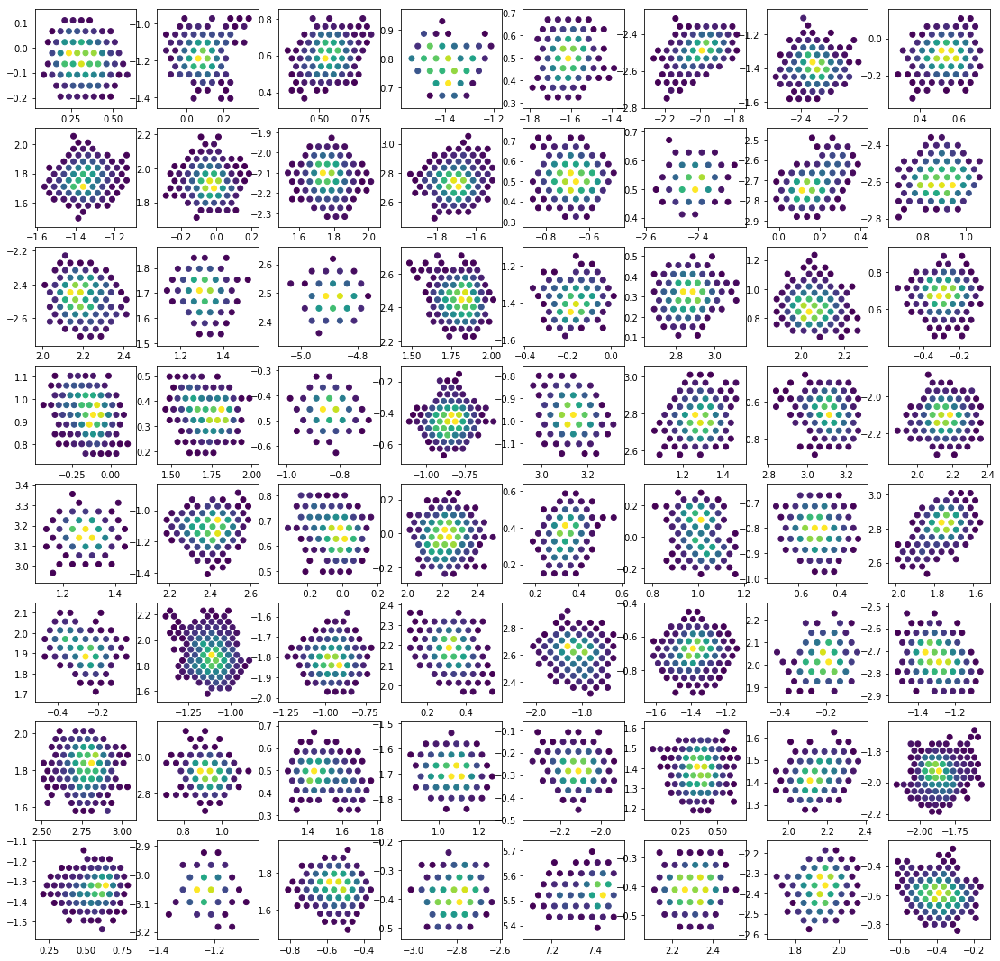

In [54]:
data_dir = home_dir +'data/cleaned/fabio_unpolarized/Unpol_3p7_ang0_pol_meas_sparse_hex_tracks_cleaned_100000.h5'
plt.figure(figsize=(19,19))
with h5py.File(data_dir, 'r') as f:
    for i in range(1,65):
        plt.subplot(8,8,i)
        plt.scatter(f['x'][i+20000],f['y'][i+20000],c=f['Q'][i+20000], cmap='viridis')

In [52]:
data_length

151200

In [45]:
X, mom, mom_phi, bars = torch.load(home_dir + "data/expanded/recon/meas6p4_ROB/train/data_full.pt")

1.0008849873225212


(array([7.505e+03, 6.715e+03, 5.472e+03, 4.817e+03, 4.250e+03, 3.858e+03,
        3.577e+03, 3.252e+03, 3.059e+03, 2.827e+03, 2.655e+03, 2.372e+03,
        2.210e+03, 2.019e+03, 1.855e+03, 1.633e+03, 1.566e+03, 1.445e+03,
        1.333e+03, 1.233e+03, 1.123e+03, 1.014e+03, 9.360e+02, 8.420e+02,
        7.480e+02, 6.900e+02, 6.490e+02, 5.890e+02, 5.460e+02, 4.730e+02,
        4.700e+02, 3.810e+02, 3.610e+02, 3.320e+02, 3.000e+02, 2.590e+02,
        2.190e+02, 2.450e+02, 2.240e+02, 1.780e+02, 1.830e+02, 1.630e+02,
        1.490e+02, 1.190e+02, 1.230e+02, 1.060e+02, 9.300e+01, 9.300e+01,
        8.500e+01, 6.200e+01, 7.700e+01, 7.900e+01, 6.700e+01, 5.100e+01,
        3.900e+01, 4.000e+01, 4.300e+01, 3.600e+01, 3.000e+01, 3.800e+01,
        2.100e+01, 3.200e+01, 3.900e+01, 2.200e+01, 1.800e+01, 1.700e+01,
        2.600e+01, 1.900e+01, 2.100e+01, 1.000e+01, 1.100e+01, 1.500e+01,
        1.000e+01, 1.100e+01, 1.200e+01, 8.000e+00, 8.000e+00, 7.000e+00,
        5.000e+00, 7.000e+00, 1.100e+0

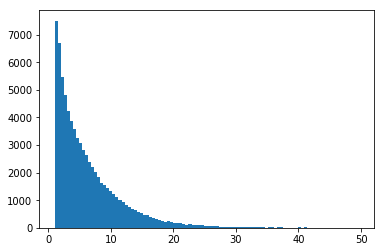

In [46]:
momnan = [x for x in mom if x <50]
print(min(momnan))
plt.hist(momnan, bins=100)

In [ ]:
X, mom,mom_phi = torch.load(home_dir + "data/expanded/fulltest/meas5p9_UnPol/train/data_full.pt")
X2, mom2,mom_phi2 = torch.load(home_dir + "data/expanded/fulltest/meas2p7_UnPol/train/data_full.pt")
X6, mom6,mom_phi6 = torch.load(home_dir + "data/expanded/fulltest/meas6p4_Pol/train/data_full.pt")
X6_og, mom6_og,mom_phi6_og = torch.load(home_dir + "data/expanded/fulltest/meas6p4_ROB/train/data_full.pt")

In [73]:
print(np.ndarray.flatten((X.numpy()[X.numpy()>0])[:30000]).shape)
print(np.ndarray.flatten((X6.numpy()[X6.numpy()>0])[:30000]).shape)


(30000,)
(30000,)


(array([1.0195e+04, 7.3890e+03, 6.1520e+03, 4.9910e+03, 4.2330e+03,
        3.3170e+03, 3.1380e+03, 2.5960e+03, 2.3040e+03, 1.9830e+03,
        1.5970e+03, 1.3100e+03, 1.3350e+03, 1.1030e+03, 9.8000e+02,
        8.3700e+02, 6.8300e+02, 6.5500e+02, 5.8000e+02, 5.6000e+02,
        4.2000e+02, 3.8800e+02, 3.2500e+02, 3.4100e+02, 2.7300e+02,
        2.8200e+02, 1.9200e+02, 1.7600e+02, 1.8600e+02, 1.7300e+02,
        1.4200e+02, 1.3400e+02, 1.0100e+02, 7.9000e+01, 1.1100e+02,
        8.5000e+01, 6.3000e+01, 6.0000e+01, 4.7000e+01, 4.8000e+01,
        4.8000e+01, 3.7000e+01, 4.1000e+01, 2.9000e+01, 2.3000e+01,
        2.5000e+01, 1.7000e+01, 9.0000e+00, 2.4000e+01, 1.6000e+01,
        1.6000e+01, 1.1000e+01, 1.2000e+01, 1.3000e+01, 1.4000e+01,
        5.0000e+00, 9.0000e+00, 1.1000e+01, 7.0000e+00, 5.0000e+00,
        8.0000e+00, 5.0000e+00, 4.0000e+00, 2.0000e+00, 3.0000e+00,
        1.0000e+00, 2.0000e+00, 2.0000e+00, 5.0000e+00, 2.0000e+00,
        0.0000e+00, 5.0000e+00, 1.0000e+00, 0.00

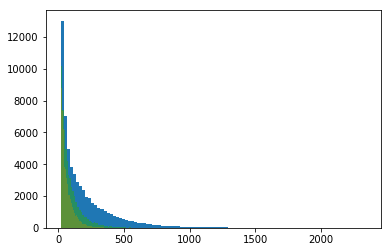

In [76]:
plt.figure()
plt.hist(np.ndarray.flatten((X.numpy()[X.numpy()>0])[:60000]), bins=100)
plt.hist(np.ndarray.flatten((X6.numpy()[X6.numpy()>0])[:60000]), bins=100, alpha=0.6)
plt.hist(np.ndarray.flatten((X6_og.numpy()[X6_og.numpy()>0])[:60000]), bins=100, alpha=0.6)

In [57]:
print(mom.numpy())

[ 1.70476978  1.82017039  4.33051562 ...  3.80789626  1.37735243
 21.60593717]


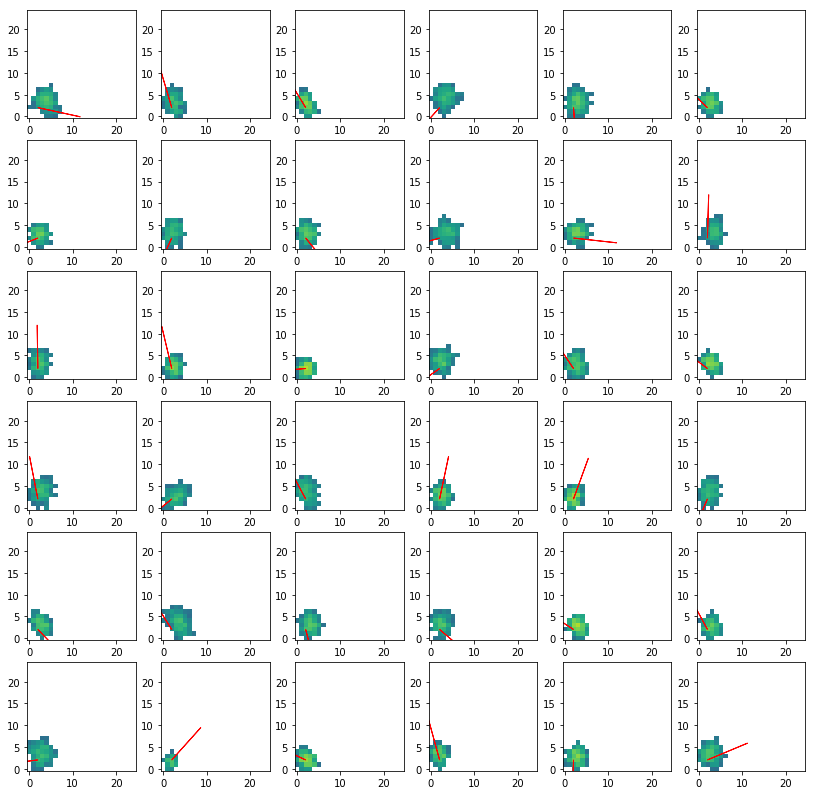

In [7]:
plt.figure(figsize=(14,14))
for i in range(1,37):
    plt.subplot(6,6,i)
    plt.imshow(X[i+1000,0,:,:], origin='lower',norm=LogNorm(vmin=3, vmax=600))
    plt.arrow(2,2,10 * np.cos(mom_phi[i+1000]), 10 * np.sin(mom_phi[i+1000]),color='r')
    #plt.arrow(5,5,10 * y[i+30000,0,0], 10 * y[i+30000,0,1],color='r')

In [10]:
X_stack = torch.stack(X)

In [11]:
y_stack = torch.stack(y)

In [39]:
X_stack.element_size() * X_stack.nelement() * 1e-9

1.17301272

In [15]:
y_stack.view(-1,2)

tensor([[ 0.9970, -0.0777],
        [ 0.5658,  0.8246],
        [-0.4312,  0.9023],
        ...,
        [ 0.8960,  0.4442],
        [ 0.0633,  0.9980],
        [-0.8326,  0.5538]], dtype=torch.float64)

In [26]:
y_fullstack = y.view(-1,2)

In [27]:
angles = np.arctan2(y_fullstack[:,1].numpy(), y_fullstack[:,0].numpy())


In [28]:
angles.shape

(251284,)

In [30]:
np.sum(angles==0.0)*4

476

In [27]:
len(s)

186263

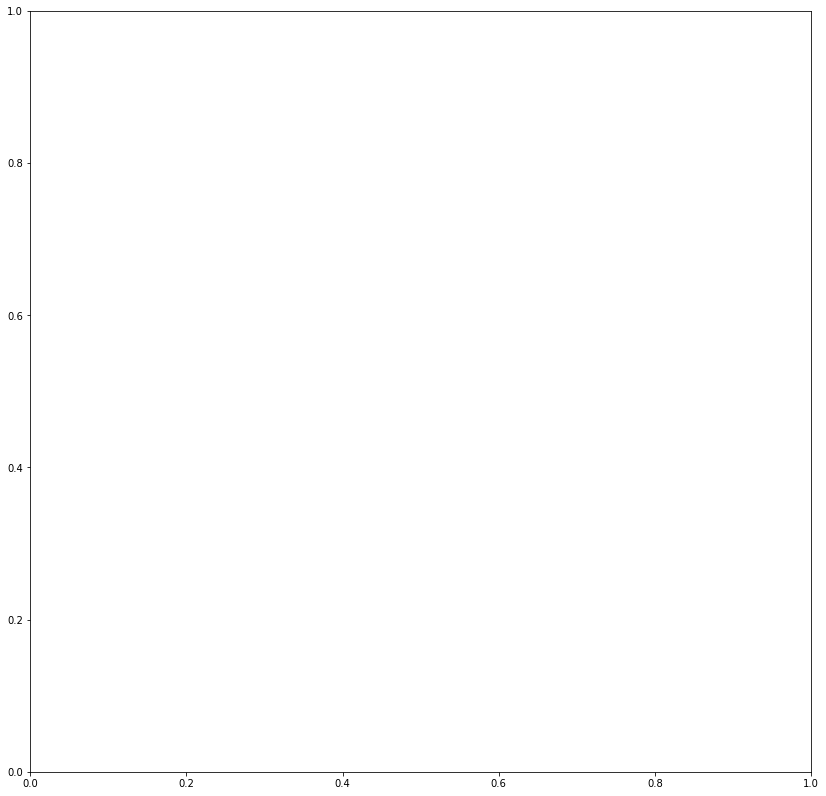

In [11]:
angles = np.arctan2(y_fullstack[:,1].numpy(), y_fullstack[:,0].numpy())
angles = angles[angles==0.0]

plt.figure(figsize=(14,14))
for i in range(1,37):
#     plt.subplot(6,6,i)
#     plt.imshow(X[i,0,:,:], origin='lower',norm=LogNorm(vmin=3, vmax=200))
    plt.arrow(5,5,10 * np.cos(angles[i]), 10 * np.sin(angles[i]),color='r')

In [23]:
angles.shape

AttributeError: 'NoneType' object has no attribute 'shape'

(array([50000.]),
 array([-3.14155128,  3.14156265]),
 <a list of 1 Patch objects>)

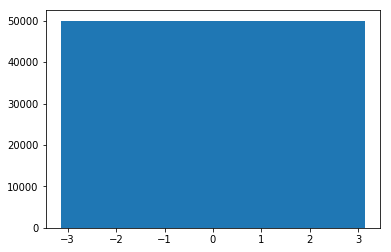

In [38]:
from astropy.visualization import hist
np.random.shuffle(angles)
hist(angles[:50000], bins='blocks')

In [2]:
network = "gen2a_rot_cosbnFIN"

In [3]:
data_file = home_dir +'data/nn/' + network + '/gen2a_combined_rot.h5'
with h5py.File(data_file, 'r') as f:
    validate = DenseSquareSimTracks.load(f=f['validate'])

In [3]:
data_hex =  home_dir +'data/expanded/gen2a_rot/' + 'gen2a_6p0_ang0_sim_sparse_hex_tracks_0pol_15000tot.h5'
with h5py.File(data_hex, 'r') as f:
    hexo = SparseHexSimTracks.load(f=f['validate'])

[ 0.18606619  0.10876097 10.2590143 ]
--- [12.         12.          8.06671072]
[0.09238428 0.03607719 4.72973852]
--- [4.         4.         8.06671072]
[ 0.10342642 -0.09265203  3.93227907]
--- [ 5.         11.          8.06671072]
[0.47047836 0.53211315 3.84973662]
--- [13.         13.          8.06671072]
[-0.56734473 -0.0995825   5.89433618]
--- [7.         4.         8.06671072]
[-0.17200922  0.38168954  5.65660956]
--- [2.         6.         8.06671072]
[-0.30777495  0.07608737  5.41066009]
--- [5.         6.         8.06671072]
[5.         6.         8.06671072]
--- [-186.           -3.            8.06671072]


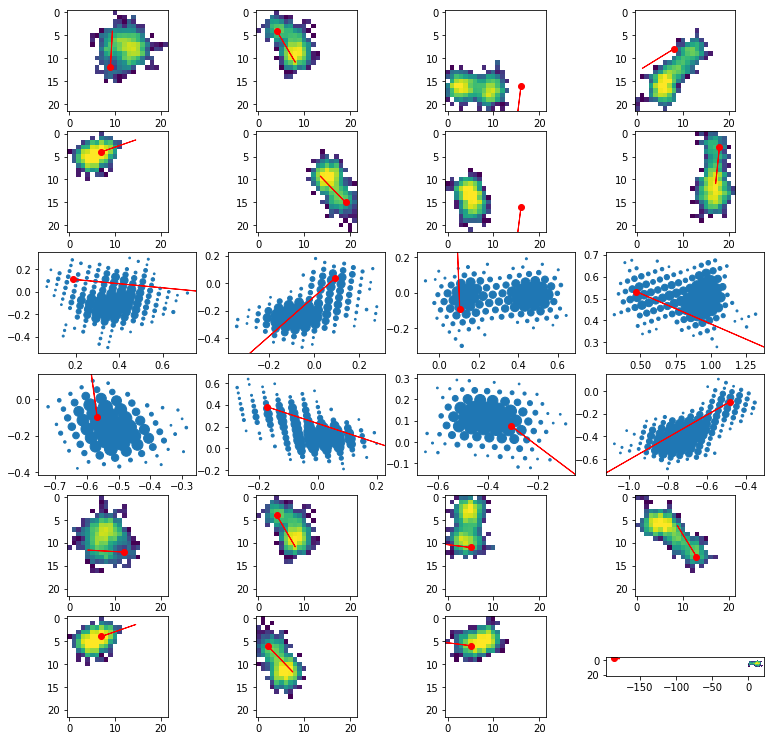

In [9]:
vlength = 8
plt.figure(figsize=(13,13))
for i in range(1,25):
    plt.subplot(6,4,i)
    if i < 9:
        angle = validate.angles[i]
        abs_pt = validate.absorption_points[i]
        plt.imshow(validate.tracks_cube[i],norm=LogNorm(vmin=3, vmax=200))
        plt.scatter(abs_pt[0],abs_pt[1],c='r')
        plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')
    elif i < 17:
        j = i - 8
        angle = hexo.angles[j]
        abs_pt = hexo.absorption_points[j]
        plt.scatter(hexo.x[j],hexo.y[j],hexo.Q[j])
        plt.scatter(abs_pt[0],abs_pt[1],c='r')
        plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')
    else:
        j = i - 16
        print(hexo.absorption_points[j])
        square, angle, abs_pt, _, _ = hex2square(hexo.x[j],hexo.y[j],hexo.Q[j],hexo.angles[j],hexo.absorption_points[j])
        print('---',abs_pt)
        plt.imshow(square,norm=LogNorm(vmin=3, vmax=200))
        plt.scatter(abs_pt[0],abs_pt[1],c='r')
        plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')
        
    #plt.colorbar()

In [25]:
def hex2square(x,y,q,angle,abs_pts):
    n_pixels=22
    abs_pt = np.empty(2)
    y = y[np.isfinite(y)]
    x = x[np.isfinite(x)]
    q = q[q != -1]
    
    adj = np.argmin(np.sqrt((x - x[0])**2 +  (y - y[0])**2)[1:]) + 1 #find adjacent point
    r = np.sqrt((x[0]-x[adj])**2 + (y[0]-y[adj])**2) / 2
    a = r / np.cos(30*np.pi/180)
    
    x_ws = x[0] #np.nansum(x * q_norm)  # weighted sum
    y_ws = y[0] #np.nansum(y * q_norm)
    
    x,y = x-x_ws, y-y_ws
    abs_pt[0], abs_pt[1] = abs_pts[0]-x_ws, abs_pts[1]-y_ws
    
    radius = np.sqrt(x**2 + y**2)
    rad_abs = np.sqrt(abs_pt[0]**2 + abs_pt[1]**2)
    theta = np.arctan2(y,x)
    theta_abs = np.arctan2(abs_pt[1],abs_pt[0])
    rotation = np.arccos((y[adj]) / (np.sqrt((y[adj])**2 + (x[adj])**2)))
    if (x[adj] < 0):
        rotation = -rotation
    x,y = radius*np.cos(theta+rotation), radius*np.sin(theta+rotation)
    abs_pt[0],abs_pt[1] = rad_abs*np.cos(theta_abs+rotation), rad_abs*np.sin(theta_abs+rotation)
    #adj_abs = np.argmin(np.sqrt((x - abs_pt[0])**2 +  (y - abs_pt[1])**2))
    angle_new = angle + rotation 
    if angle_new > np.pi:
        angle_new -= 2*np.pi
    elif angle_new < -np.pi:
        angle_new += 2*np.pi
    
    angle_new = -angle_new
    y = np.where(np.mod(np.round((x-x.min())/(1.5*a)),2)==1, y+r, y)
    #abs_pt[1] = np.where(np.mod(np.round((abs_pt[0]-x.min())/(1.5*a)),2)==1, abs_pt[1]+r, abs_pt[1])
    i,j = np.round((x-x.min()) / (1.5*a)), np.round((-1*(y-y.max())) / (2*r))
    i_abs, j_abs = np.round((abs_pt[0]-x.min()) / (1.5*a)), np.round((-1*(abs_pt[1]-y.max())) / (2*r))
    
    abs_pt[0], abs_pt[1] = i_abs, j_abs
    maxi = np.max(i)
    maxj = np.max(j)

    square = np.zeros((22,22))
    bol = (i<n_pixels) * (j<n_pixels)
    square[j[bol].astype(np.int),i[bol].astype(np.int)] = q[bol]
    
    return square, angle_new, abs_pt, maxi, maxj #square array

In [18]:
Is = []
Js = []
sqs = []
angs = []
absptX = []
absptY = []
for k in range(10000):
    abs_pts = hexo.absorption_points[k]
    x = hexo.x[k] 
    y= hexo.y[k]
    q = hexo.Q[k]
    angle = hexo.angles[k]
    sq, angle_new, abs_pt, maxi, maxj = hex2square(x,y,q,angle,abs_pts)
    Is.append(maxi)
    Js.append(maxj)
    sqs.append(sq)
    angs.append(angle_new)
    absptX.append(abs_pt[0])
    absptY.append(abs_pt[1])

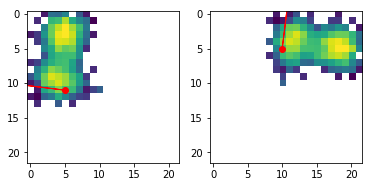

In [28]:
idx = 3
square, angle, abs_pt, _, _ = hex2square(hexo.x[idx],hexo.y[idx],hexo.Q[idx],hexo.angles[idx],hexo.absorption_points[idx])
plt.subplot(1,2,1)
plt.imshow(square,norm=LogNorm(vmin=3, vmax=200))
plt.scatter(abs_pt[0],abs_pt[1],c='r')
plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')

n=3
plt.subplot(1,2,2)
abspt_rot = np.zeros(2)
square_rot = np.rot90(square,n)
angle_rot = angle - n * np.pi/2
if n == 1:
    abspt_rot[1] = 21 - abs_pt[0]
    abspt_rot[0] = abs_pt[1]
elif n==2:
    abspt_rot[1] = 21 - abs_pt[1]
    abspt_rot[0] = 21 - abs_pt[0]
elif n==3:
    abspt_rot[1] = abs_pt[0]
    abspt_rot[0] = 21 - abs_pt[1]
else:
    abspt_rot[1] = abs_pt[1]
    abspt_rot[0] = abs_pt[0]
    
plt.imshow(square_rot,norm=LogNorm(vmin=3, vmax=200))
plt.scatter(abspt_rot[0],abspt_rot[1],c='r')
plt.arrow(abspt_rot[0],abspt_rot[1],vlength * np.cos(angle_rot), vlength * np.sin(angle_rot),color='r')

In [4]:
from prep.convert_hex_to_square_tracks import hex2square

In [17]:
square_tracks = hex2square(hexo, 22, pitch=0.0, rot90=True, mirror=True, translate=True)

|_|ing track 0


In [18]:
validate = square_tracks

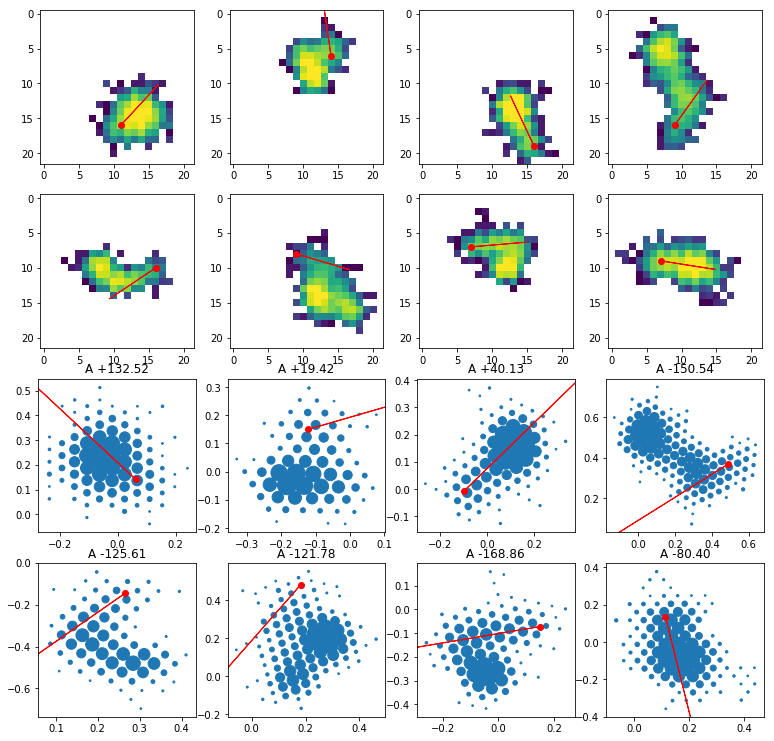

In [19]:
vlength = 8
plt.figure(figsize=(13,13))
for i in range(1,17):
    plt.subplot(4,4,i)
    if i < 9:
        angle = validate.angles[i]
        abs_pt = validate.absorption_points[i]
        plt.imshow(validate.tracks_cube[i],norm=LogNorm(vmin=3, vmax=200))
        plt.scatter(abs_pt[0],abs_pt[1],c='r')
        plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')
        #plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(-(angle + validate.rotations[i,1] * np.pi/2) - validate.rotations[i,0]), vlength * np.sin(-(angle + validate.rotations[i,1] * np.pi/2) - validate.rotations[i,0]),color='b')
        #plt.title("A {:+.2f}, R {:+.2f}".format(180*(-(angle + validate.rotations[i,1] * np.pi/2) - validate.rotations[i,0])/np.pi,180*(validate.rotations[i,1]*np.pi/2)/np.pi))
    elif i < 17:
        j = i - 8
        angle = hexo.angles[j]
        abs_pt = hexo.absorption_points[j]
        plt.scatter(hexo.x[j],hexo.y[j],hexo.Q[j])
        plt.scatter(abs_pt[0],abs_pt[1],c='r')
        plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')
        plt.title("A {:+.2f}".format(180*angle/np.pi))

In [11]:
-415.82 + 2*360

-55.81999999999999

In [15]:
data_hex =  home_dir +'data/cleaned/' + 'set1_6p4_pol_meas_sparse_hex_tracks_cleaned.h5'
f = h5py.File(data_hex, 'r')


(array([166., 443., 287.,  61.,   4.,  14.,  21.,   2.,   0.,   2.]),
 array([ 3. ,  8.2, 13.4, 18.6, 23.8, 29. , 34.2, 39.4, 44.6, 49.8, 55. ]),
 <a list of 10 Patch objects>)

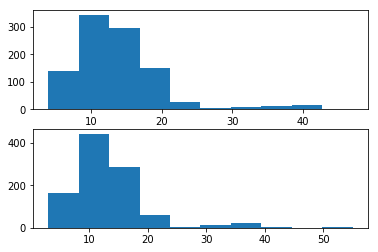

In [29]:
Is = []
Js = []
for i in range(1000):
    _, _, _, maxi, maxj = hex2square(f['x'][i],f['y'][i],f['Q'][i],angle=0,abs_pts=(0,0))
    Is.append(maxi)
    Js.append(maxj)
plt.subplot(211)
plt.hist(Is,10)
plt.subplot(212)
plt.hist(Js,10)

(array([ 39., 127., 168., 275., 159., 128.,  56.,   5.,   3.,   1.,   7.,
          7.,  13.,   8.,   2.,   0.,   0.,   0.,   1.,   1.]),
 array([ 3. ,  5.6,  8.2, 10.8, 13.4, 16. , 18.6, 21.2, 23.8, 26.4, 29. ,
        31.6, 34.2, 36.8, 39.4, 42. , 44.6, 47.2, 49.8, 52.4, 55. ]),
 <a list of 20 Patch objects>)

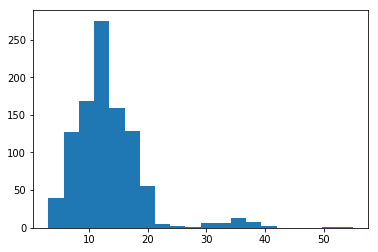

In [31]:
plt.hist(Js,20)

In [10]:
f = h5py.File(home_dir + 'data/expanded/gen2a_rot/set1_6p4_meas_dense_square_tracks_0pol_76789tot.h5','r')
f['train'].keys()

<KeysViewHDF5 ['centroids', 'n_tracks', 'pitch', 'tracks_cube', 'tracks_max', 'tracks_mean', 'tracks_std']>

In [25]:
bad_tracks = [np.sum(bad_track) for bad_track in bad_tracks]

In [34]:
np.mean(bad_tracks)

37597.04269373288

In [33]:
sum_tracks = [np.sum(track) for track in f['train']['tracks_cube'][:]]

In [36]:
np.std(sum_tracks)

6854.295448585797

bad:  0


IndexError: list index out of range

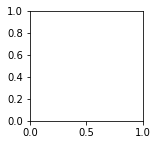

In [42]:
#set1_3p7_meas_dense_square_tracks_0pol_247717trans.h5
f = h5py.File(home_dir + 'data/expanded/gen2a_aug/gen2a_combined_aug3-4.h5','r')
bad_tracks = []
for track in f['test']['tracks_cube'][:]:
    if np.count_nonzero(track) > 0.45*22**2:
        bad_tracks.append(track)
        
print('bad: ', len(bad_tracks))
plt.figure(figsize=(19,19))
for i in range(1,65):
   plt.subplot(8,8,i)
   plt.imshow(bad_tracks[i], norm=LogNorm(vmin=3, vmax=200))
    

In [22]:
6207/247789

0.025049538115089854

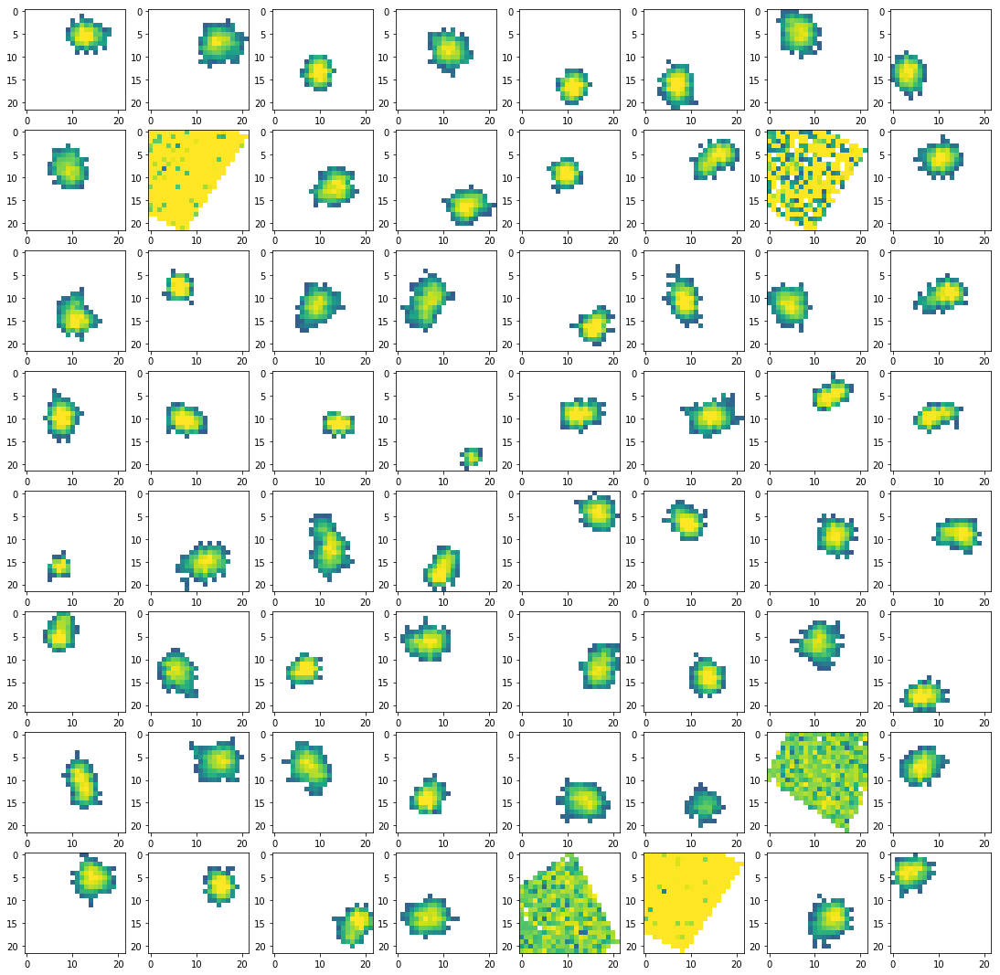

In [10]:
plt.figure(figsize=(19,19))
f = h5py.File(home_dir + 'data/expanded/gen2a_aug/set1_3p7_meas_dense_square_tracks_0pol_247717trans.h5','r')
for i in range(1,65):
   plt.subplot(8,8,i)
   #square, _, _, maxi, maxj = hex2square(f['x'][i],f['y'][i],f['Q'][i],angle=0,abs_pts=(0,0))
   #plt.imshow(square, norm=LogNorm(vmin=3, vmax=200))
   plt.imshow(f['train']['tracks_cube'][i], norm=LogNorm(vmin=3, vmax=200))
   #plt.scatter(f['x'][i],f['y'][i],f['Q'][i])

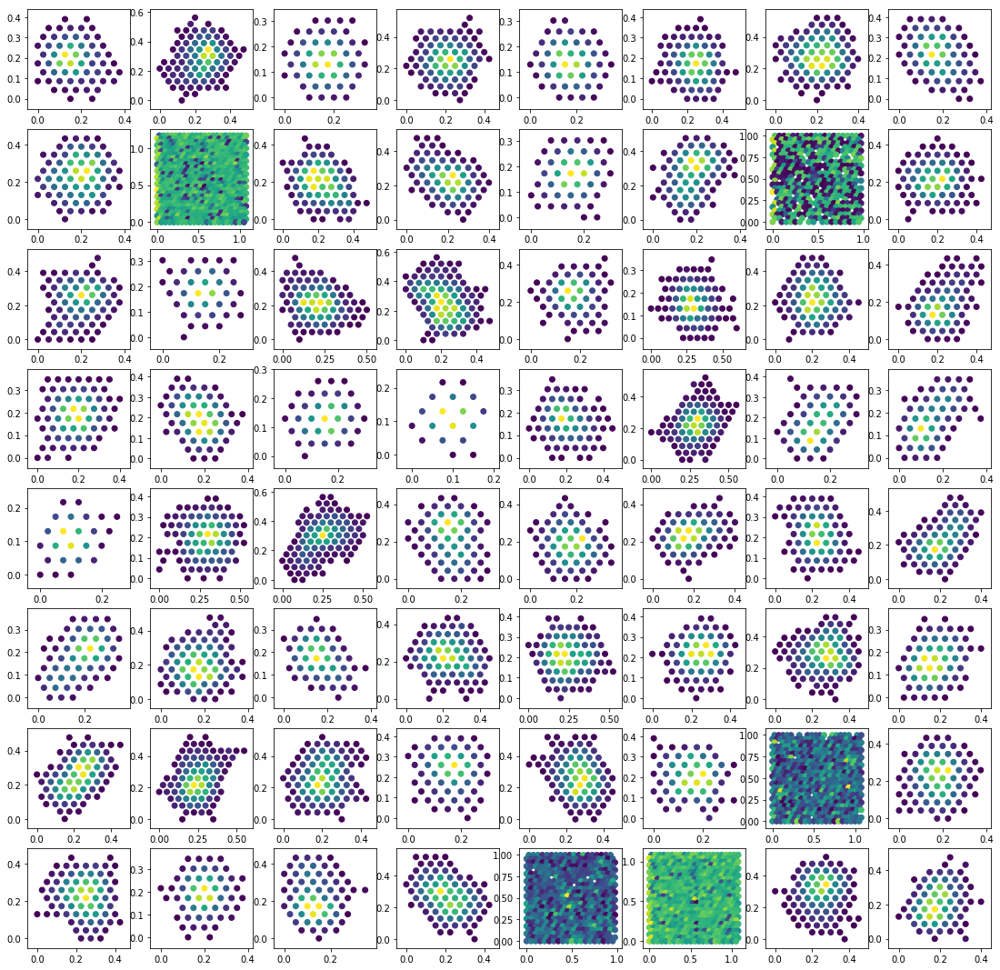

In [18]:
plt.figure(figsize=(19,19))
f = h5py.File(home_dir + 'data/expanded/gen2a_aug/set1_3p7_meas_sparse_hex_tracks_1pol_247717tot.h5','r')
for i in range(1,65):
   plt.subplot(8,8,i)
    
   #square, _, _, maxi, maxj = hex2square(f['x'][i],f['y'][i],f['Q'][i],angle=0,abs_pts=(0,0))
   #plt.imshow(square, norm=LogNorm(vmin=3, vmax=200))
   #plt.imshow(f['train']['tracks_cube'][i], norm=LogNorm(vmin=3, vmax=200))
   plt.scatter(f['train']['x'][i] - np.nanmin(f['train']['x'][i]),f['train']['y'][i] - np.nanmin(f['train']['y'][i]),c=f['train']['Q'][i])
    

(array([262., 218., 245., 227., 257., 233., 237., 241., 233., 237., 208.,
        243., 264., 231., 240., 255., 235., 244., 258., 211., 258., 233.,
        252., 243., 217., 298., 225., 225., 256., 241., 233., 258., 232.,
        249., 234., 217., 221., 241., 254., 250., 249., 220., 219., 218.,
        243., 259., 247., 239., 260., 230.]),
 array([-3.14128845e+00, -3.01566472e+00, -2.89004098e+00, -2.76441725e+00,
        -2.63879352e+00, -2.51316979e+00, -2.38754605e+00, -2.26192232e+00,
        -2.13629859e+00, -2.01067486e+00, -1.88505112e+00, -1.75942739e+00,
        -1.63380366e+00, -1.50817993e+00, -1.38255620e+00, -1.25693246e+00,
        -1.13130873e+00, -1.00568500e+00, -8.80061266e-01, -7.54437534e-01,
        -6.28813801e-01, -5.03190069e-01, -3.77566337e-01, -2.51942604e-01,
        -1.26318872e-01, -6.95139818e-04,  1.24928593e-01,  2.50552325e-01,
         3.76176057e-01,  5.01799789e-01,  6.27423522e-01,  7.53047254e-01,
         8.78670986e-01,  1.00429472e+00,  1.12991

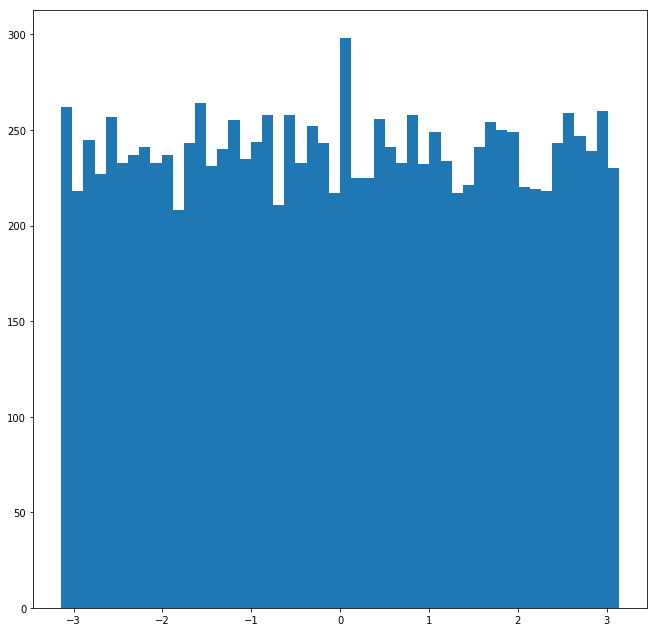

In [59]:
plt.figure(figsize=(11,11))

angles = np.array([])
for i in [0,15,30,45,60,75,90,105,120,135,150,165]:
    f = h5py.File(home_dir + 'data/cleaned/gen2a/gen2a_3p5_ang{}_pol_sim_sparse_hex_tracks_cleaned.h5'.format(i),'r')
    angles = np.concatenate((angles,f['angles'][:1000]))
    
plt.hist(angles,50)

# for i in range(1,65):
#     plt.subplot(8,8,i)
    
#     #square, _, _, maxi, maxj = hex2square(f['x'][i],f['y'][i],f['Q'][i],angle=0,abs_pts=(0,0))
#     #plt.imshow(square, norm=LogNorm(vmin=3, vmax=200))
#     #plt.imshow(f['train']['tracks_cube'][i], norm=LogNorm(vmin=3, vmax=200))
#     plt.scatter(f['x'][i] - np.nanmin(f['x'][i]),f['y'][i] - np.nanmin(f['y'][i]),c=f['Q'][i])
#     plt.title(np.rad2deg(f['angles'][i]))


36
y,  12
Q, [  3   8   3   3   4   3   4   4   3   6   5   8  18   8   4   4   4  12
   9   4   8   5  14  23  23  15   3   5   3  14  26  23  37  28  16  12
  13  37  49  32  19   5   3   9  27  55  64  63  61  47  34  46  68 101
  85  56  32  11  15  45  67  75  72  63  50  50  79 152 171 129  80  36
   8  11  32  48  55  42  28  35  72 135 225 201 115  52  16   4  11  17
  32  27  20  13  41  72 149 178 121  66  26   5   4  13  14   6   4  15
  25  43 102  93  60  25   8   4   4   8  19  39  39  13   6   3   5   5
  13   4   4   3   3  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1
  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1
  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1
  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1
  -1  -1  -1  -1  -1  -1  -1  -1  -1  -1]


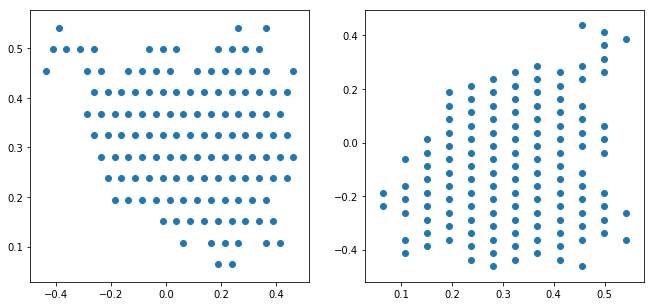

In [28]:
f = h5py.File(home_dir + 'data/cleaned/gen2a/gen2a_5p5_ang{}_pol_sim_sparse_hex_tracks_cleaned.h5'.format(i),'r')
print(len(set(f['x'][10][np.isfinite(f['x'][10])])))
print('y, ', len(set(f['y'][10][np.isfinite(f['y'][10])])))
print("Q,", f['Q'][10][np.isfinite(f['Q'][10])])

plt.figure(figsize=(11,5))
plt.subplot(121)
plt.scatter(f['x'][10][np.isfinite(f['x'][10])], f['y'][10][np.isfinite(f['y'][10])])
plt.subplot(122)
x = f['x'][10][np.isfinite(f['x'][10])]
y = f['y'][10][np.isfinite(f['y'][10])]
xy = np.stack([x,y])
theta = 270 * np.pi/180
xy = np.matmul(np.array([[np.cos(theta),-np.sin(theta)],[np.sin(theta),np.cos(theta)]]), xy)
plt.scatter(xy[0,:], xy[1,:])

In [153]:
hex_tracks = SparseHexSimTracks.load(home_dir + 'data/cleaned/gen2a/gen2a_2p0_ang30_pol_sim_sparse_hex_tracks_cleaned.h5')


In [49]:
def rot60(x,y,idx):
    xy = np.stack([x,y])
    xy_rot = np.matmul(np.array([[np.cos(idx*np.pi/3),-np.sin(idx*np.pi/3)],[np.sin(idx*np.pi/3),np.cos(idx*np.pi/3)]]), xy)
    return xy_rot[0],xy_rot[1]

def reflect(x,y,idx):
    if idx not in [0,1,2,3,4,5]: #identity
        return x,y
    else:
        xy = np.stack([x,y])
        theta = 2 * (idx * np.pi/6)
        xy_mirror = np.matmul(np.array([[np.cos(theta),np.sin(theta)],[np.sin(theta),-np.cos(theta)]]), xy) 
        return xy_mirror[0], xy_mirror[1]


def hex2square_sub(hex_track, n_pixels, augment):
    sim = False
    if hasattr(hex_track, 'angle'):
        sim = True

    if sim:
        angles_sq = np.zeros(augment)
        mom_phis_sq = np.zeros(augment)
        abs_pts_sq = np.zeros((augment, 2))
        abs_pt_aug = np.empty(2)
    
    mom_abs_pt_aug = np.empty(2)
    mom_abs_pts_sq = np.zeros((augment, 2)) 
    tracks_cube = np.zeros((augment, n_pixels, n_pixels), dtype=np.int16)  # tracks in square coords   

    xs = cp.copy(hex_track.x)
    ys = cp.copy(hex_track.y)
    Qs = cp.copy(hex_track.Q)

    ys = ys[np.isfinite(ys)] #- np.nanmin(hex_track.y)
    xs = xs[np.isfinite(xs)] #- np.nanmin(hex_track.x)
    Qs = Qs[Qs != -1]

    mom = cp.copy(hex_track.mom)
    mom_phi = cp.copy(hex_track.mom_phi)
    mom_abs_pt = cp.copy(hex_track.mom_abs_pt)
    #mom_abs_pt[0] -= np.nanmin(hex_track.x)
    #mom_abs_pt[1] -= np.nanmin(hex_track.y)

    if sim:
        abs_pt = cp.copy(hex_track.absorption_point)
        #abs_pt[0] -= np.nanmin(hex_track.x)
        #abs_pt[1] -= np.nanmin(hex_track.y)
        
    abs_pt = np.argmin(np.sqrt((xs - abs_pt[0])**2 +  (ys - abs_pt[1])**2))  
    mom_abs_pt = np.argmin(np.sqrt((xs - mom_abs_pt[0])**2 +  (ys - mom_abs_pt[1])**2)) 

    adj = np.argmin(np.sqrt((xs - xs[0])**2 +  (ys - ys[0])**2)[1:]) + 1 #find adjacent point
    r = np.sqrt((xs[0]-xs[adj])**2 + (ys[0]-ys[adj])**2) / 2
    a = r / np.cos(30*np.pi/180)

    if sim and augment > 1:
        n_rots = np.random.choice(np.arange(6), augment, replace=False)
        n_flip = np.random.randint(0,7)
    else:
        n_rots = [0]
        n_flip = -1

    for k in range(augment):
        n_rot = n_rots[k]

        #reflect
        if sim:
            reflect_angle = reflect(np.cos(hex_track.angle),np.sin(hex_track.angle),n_flip)
            rotation = np.arctan2( reflect_angle[1], reflect_angle[0] ) - hex_track.angle
            rotation += n_rot * np.pi/3

        xs_aug, ys_aug = reflect(xs,ys,n_flip)
        
        #rotate
        xs_aug, ys_aug = rot60(xs_aug, ys_aug, n_rot)

        if sim:
            angle_new = hex_track.angle + rotation
            angle_new = np.mod(angle_new + np.pi ,2*np.pi) - np.pi
            mom_angle_new = hex_track.mom_phi + rotation
            mom_angle_new = np.mod(mom_angle_new + np.pi ,2*np.pi) - np.pi
            angles_sq[k] = angle_new
            mom_phis_sq[k] = mom_angle_new

        xs_aug = np.where(np.mod(np.round((ys_aug - ys_aug.min())/(1.5*a)),2)==1, xs_aug+r, xs_aug) #(np.round(ys_aug,5) - 0.45465)/(1.5*a)),2)==1, xs_aug+r, xs_aug)
        j,i = np.round((ys_aug-ys_aug.min()) / (1.5*a)), np.round(((xs_aug-xs_aug.min())) / (2*r))
        
        abs_pts_sq[k,0], abs_pts_sq[k,1] = i[abs_pt], j[abs_pt]
        mom_abs_pts_sq[k,0], mom_abs_pts_sq[k,1] = i[mom_abs_pt], j[mom_abs_pt]

        Q_square = np.zeros((n_pixels,n_pixels))
        bol = (i<n_pixels) * (j<n_pixels) #square crop to n_pixel size, a minority of high energy tracks will be sliced 
        Q_square[j[bol].astype(np.int),i[bol].astype(np.int)] = Qs[bol]
        tracks_cube[k, :, :] = Q_square
        
    if sim:
        return tracks_cube, angles_sq, abs_pts_sq, mom_phis_sq, mom_abs_pts_sq
    else:
        return (tracks_cube, mom_phi, mom_abs_pts_sq)  

In [50]:
input_file = home_dir + "data/gen4/gen4_4p5_recon.fits"
with fits.open(home_dir + "data/gen4/gen4_4p5_recon.fits", memmap=False) as hdu:
    data = hdu[1].data

#APPLY SOME INITIAL TRACK CUTS HERE AS IN REPORT
cut = (data['NUM_CLU'] > 0)*(abs(data['BARX']) < 6.3)*(abs(data['BARY']) < 6.3)
moms = (data['TRK_M2L'] / data['TRK_M2T'])[cut]
mom_abs_pts = np.column_stack((data['DETX'],data['DETY']))[cut]
bars = np.column_stack((data['BARX'],data['BARY']))[cut]
with fits.open(input_file.replace('_recon',''), memmap=False) as hdu:
    sim_data = hdu[3].data
cut *= (sim_data['PE_PHI'] != 0.0) #to remove bump in training data
abs_pts = np.column_stack((sim_data['ABS_X'],sim_data['ABS_Y']))[cut]
hex_tracks = SparseHexSimTracks(data['PIX_X'][cut], data['PIX_Y'][cut], data['PIX_PHA'][cut], sim_data['PE_PHI'][cut], abs_pts, moms, data['DETPHI'][cut], mom_abs_pts, bars) 


In [51]:
tracks = []
angles = []
abs_pts = []
mom_abs_pts = []
for i in range(50):
    tracks_cube, angles_sq, abs_pts_sq, mom_phis_sq, mom_abs_pts_sq = hex2square_sub(hex_tracks[i+7], 30, 2)
    tracks.append(tracks_cube)
    angles.append(angles_sq)
    abs_pts.append(abs_pts_sq)
    mom_abs_pts.append(mom_abs_pts_sq)
angles = np.reshape(np.array(angles),[-1])
tracks = np.reshape(np.array(tracks),[-1,30,30])
abs_pts = np.reshape(np.array(abs_pts),[-1,2])
mom_abs_pts = np.reshape(np.array(mom_abs_pts),[-1,2])


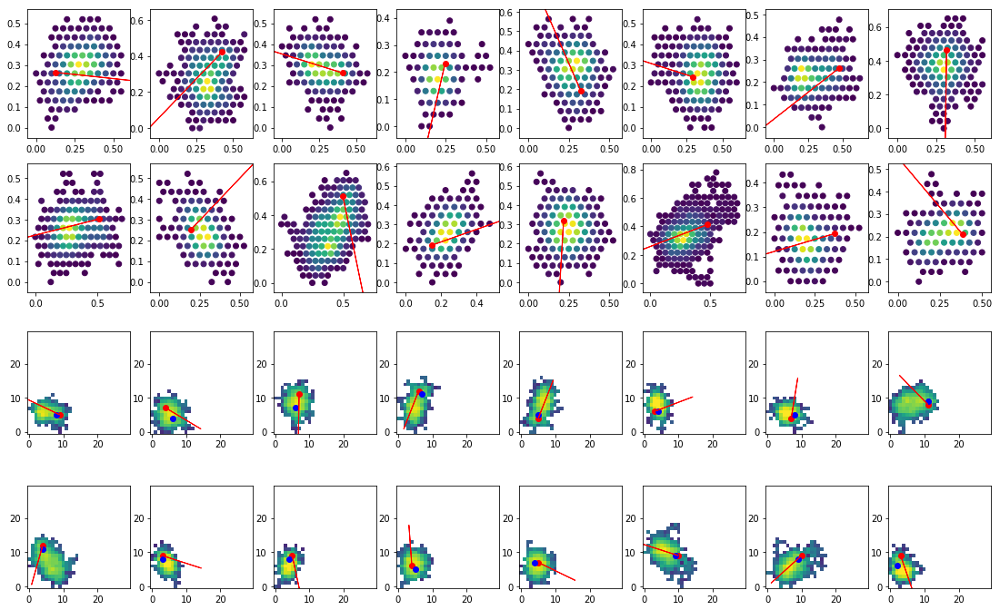

In [52]:
plt.figure(figsize=(19,12))
#f = h5py.File(home_dir + 'data/expanded/gen2a_aug/set1_3p7_meas_sparse_hex_tracks_1pol_247717tot.h5','r')
vlength=12
for i in range(1,33):
    plt.subplot(4,8,i)
    if i < 17:
        abs_pt = hex_tracks[i].absorption_point
        #print(abs_pt[0]- np.nanmin(hex_tracks[i].x),abs_pt[1]- np.nanmin(hex_tracks[i].y))
        angle = hex_tracks[i].angle
        plt.scatter(hex_tracks[i].x - np.nanmin(hex_tracks[i].x),hex_tracks[i].y - np.nanmin(hex_tracks[i].y),c=hex_tracks[i].Q)
        plt.scatter(abs_pt[0]- np.nanmin(hex_tracks[i].x),abs_pt[1]- np.nanmin(hex_tracks[i].y),c='r')
        plt.arrow(abs_pt[0]- np.nanmin(hex_tracks[i].x),abs_pt[1]- np.nanmin(hex_tracks[i].y),vlength * np.cos(angle), vlength * np.sin(angle),color='r')
    else:
        plt.imshow(tracks[i-16], norm=LogNorm(vmin=3, vmax=800),origin='lower')
        abs_pt = abs_pts[i-16]
        mom_abs_pt = mom_abs_pts[i-16]
        angle = angles[i-16]
        plt.scatter(abs_pt[0],abs_pt[1],c='r')
        plt.scatter(mom_abs_pt[0],mom_abs_pt[1],c='b')
        plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')
        
#         n_flip = np.random.randint(0,3)
#         xs,ys = reflect(hex_tracks[i-32].x - np.nanmin(hex_tracks[i-32].x),hex_tracks[i-32].y - np.nanmin(hex_tracks[i-32].y),n_flip)
#         n_rot = np.random.randint(0,6)
#         xs,ys = rot60(xs,ys,n_rot)
        
#         plt.scatter(xs,ys,c=hex_tracks[i-32].Q,cmap='plasma')
        

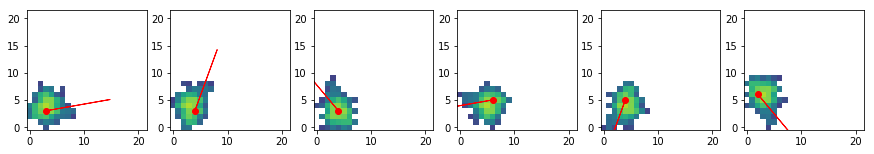

In [156]:
plt.figure(figsize=(15,15))
for j in range(1,7):
    plt.subplot(1,6,j)
    plt.imshow(square_tracks.tracks_cube[5,:,:,j-1], norm=LogNorm(vmin=3, vmax=200),origin='lower')
    abs_pt = square_tracks.absorption_points[5,:,j-1]
    angle = square_tracks.angles[5,j-1]
    plt.scatter(abs_pt[0],abs_pt[1],c='r')
    plt.arrow(abs_pt[0],abs_pt[1],vlength * np.cos(angle), vlength * np.sin(angle),color='r')

In [22]:
x = torch.rand((10,4,5,5))
y = x.view([-1,1,5,5])

In [23]:
print(x[0,2,:,:])
print(y[2])

tensor([[0.1163, 0.4432, 0.2946, 0.7966, 0.1863],
        [0.9817, 0.3109, 0.1388, 0.0665, 0.0530],
        [0.0072, 0.7085, 0.5190, 0.1585, 0.5460],
        [0.7666, 0.8559, 0.1737, 0.1508, 0.1306],
        [0.2393, 0.9979, 0.9415, 0.6321, 0.1797]])
tensor([[[0.1163, 0.4432, 0.2946, 0.7966, 0.1863],
         [0.9817, 0.3109, 0.1388, 0.0665, 0.0530],
         [0.0072, 0.7085, 0.5190, 0.1585, 0.5460],
         [0.7666, 0.8559, 0.1737, 0.1508, 0.1306],
         [0.2393, 0.9979, 0.9415, 0.6321, 0.1797]]])


In [ ]:
f = h5py.File(home_dir + 'data/expanded/gen2a_aug/set1_6p4_meas_sparse_hex_tracks_1pol_76789tot.h5','r')

(array([1.7450e+03, 6.7730e+03, 1.4053e+04, 1.9124e+04, 1.6310e+04,
        1.0543e+04, 5.0100e+03, 1.5590e+03, 8.5200e+02, 2.7800e+02,
        3.6000e+02, 1.3100e+02, 1.9000e+01, 8.0000e+00, 4.0000e+00,
        1.0000e+00, 1.0000e+00, 4.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 0.0000e+00, 2.0000e+00, 0.0000e+00, 2.0000e+00,
        2.0000e+00, 3.0000e+00, 1.0000e+00, 0.0000e+00, 3.0000e+00]),
 array([0.08659941, 0.22082853, 0.35505764, 0.48928676, 0.62351588,
        0.757745  , 0.89197412, 1.02620323, 1.16043235, 1.29466147,
        1.42889059, 1.5631197 , 1.69734882, 1.83157794, 1.96580706,
        2.10003617, 2.23426529, 2.36849441, 2.50272353, 2.63695264,
        2.77118176, 2.90541088, 3.03964   , 3.17386912, 3.30809823,
        3.44232735, 3.57655647, 3.71078559, 3.8450147 , 3.97924382,
        4.11347294]),
 <a list of 30 Patch objects>)

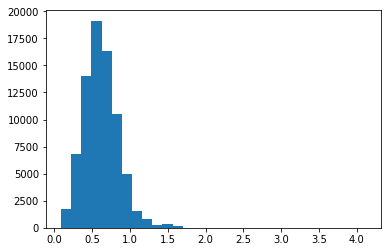

In [6]:
x = np.nanmax(f['train']['y'][()],axis=1) - np.nanmin(f['train']['y'][()],axis=1)
plt.hist(x,30)

# DataLoader

In [3]:
import h5py
import helpers
import numpy as np
from pathlib import Path
import torch
from torch.utils import data

In [74]:
class H5Dataset(data.Dataset):
    def __init__(self, h5_path, split, datatype='sim' ,losstype='ang' ,transform=None):
        #simple solution, just reading in as numpy array held in memory for now, H5 read too slow
        super(H5Dataset, self).__init__()
        self.split = split
        self.transform = transform
        self.path = h5_path
        self.data = None
        
#         f = h5py.File(h5_path,'r')

        #with h5py.File(h5_path,'r') as f:
#         self.max = f.get(self.split + '/tracks_max')
#         self.mean = f.get(self.split + '/tracks_mean')
#         self.std = f.get(self.split + '/tracks_std')
#         self.tracks_cube = f.get(self.split + '/tracks_cube')
        self.length, self.pixels, _ = (50000, 22, 22)
#         if (datatype == 'sim'):
#            self.absorption_points = f.get(self.split + '/absorption_points')
#            self.angles = f.get(self.split + '/angles')
#         else:
#            self.angles = np.zeros(self.length) #array of 0s for meas data
        
#         if (losstype == 'cos'):
#            #change angles (y) to a vector on the unit circle, to fit with loss function '2pos'
#            self.angles = np.concatenate((np.cos(self.angles).reshape(-1,1), np.sin(self.angles).reshape(-1,1)), axis=1)
#         elif (losstype == 'CE'):
#              self.angles = np.digitize((180 / np.pi) * self.angles + 180, bins=np.linspace(90,360,6) )
#         elif (losstype == 'abs_pts'):
#              if (datatype == 'sim'):
#                 self.angles = self.absorption_points[:,:2] / self.pixels #normalize abs pt positions to between 0 and 1
#              else:
#                 self.angles = np.zeros((self.length,2)).astype(np.float32)
    
    def __getitem__(self, index):
        if self.data == None:
            self.dataset = h5py.File(self.path, 'r').get(self.split + '/tracks_cube')
#         track_cube = self.tracks_cube[index].astype(np.float32)
#         angle = self.angles[index].astype(np.float32)
        #record = self.h5_file[str(index)]
        sample = (self.dataset[index].astype(np.float32), #datum
                   self.dataset[index].astype(np.float32),) #target 

        if self.transform:
            sample = self.transform(sample)

        return sample

    def __len__(self):
        return self.length
    
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""

    def __call__(self, sample):
        track_image, angle = sample

        # expand dims to include channel dimension
        # torch image: C X H X W
        #track_image = np.expand_dims(track_image, axis=0)

        return (torch.from_numpy(track_image),
                torch.from_numpy(angle))

class ZNormalize(object):
    """Normalizes data to mean and std of training set"""

    def __init__(self, mean, std, set_max):
        self.mean = mean
        self.std = std
        self.set_max = set_max

    def __call__(self, sample):
        track_image, angle = sample
        track_image /= self.set_max # set all values to be floats between 0 and 1 
        track_image -= self.mean #centre data on mean per pixel
        return ( np.divide(track_image, self.std, out=np.zeros_like(track_image), where=self.std!=0), #make sure we dont divide by 0 if pixel std = 0
                  angle )


In [79]:
data_dir = home_dir + 'data/expanded/set1_6p4_sim_dense_square_tracks_0pol_50000tot.h5'

# with h5py.File(data_file, 'r') as f:
#     mean = f['train']['tracks_mean'][()]
#     std = f['train']['tracks_std'][()] 
#     maxx = f['train']['tracks_max'][()]

kwargs = {'num_workers': 4, 'pin_memory': True}
test = H5Dataset(data_dir, 'train', 'sim', losstype='cos')
test_loader = torch.utils.data.DataLoader(test, batch_size=128, shuffle=True, **kwargs)

In [82]:
print(h5py.__version__)

2.9.0


In [80]:
for batch_idx, (X_batch, y_batch) in enumerate(test_loader):
    print(batch_idx)
    print(X_batch.shape)

OSError: Traceback (most recent call last):
  File "/share/software/user/open/py-pytorch/1.0.0_py36/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 138, in _worker_loop
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "/share/software/user/open/py-pytorch/1.0.0_py36/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 138, in <listcomp>
    samples = collate_fn([dataset[i] for i in batch_indices])
  File "<ipython-input-74-3450192ad198>", line 41, in __getitem__
    sample = (self.dataset[index].astype(np.float32), #datum
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/home/users/alpv95/.local/lib/python3.6/site-packages/h5py/_hl/dataset.py", line 573, in __getitem__
    self.id.read(mspace, fspace, arr, mtype, dxpl=self._dxpl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5d.pyx", line 181, in h5py.h5d.DatasetID.read
  File "h5py/_proxy.pyx", line 130, in h5py._proxy.dset_rw
  File "h5py/_proxy.pyx", line 84, in h5py._proxy.H5PY_H5Dread
OSError: Can't read data (inflate() failed)


In [4]:
class HDF5Dataset(data.Dataset):
    """Represents an abstract HDF5 dataset.
    
    Input params:
        file_path: Path to the folder containing the dataset (one or multiple HDF5 files).
        recursive: If True, searches for h5 files in subdirectories.
        load_data: If True, loads all the data immediately into RAM. Use this if
            the dataset is fits into memory. Otherwise, leave this at false and 
            the data will load lazily.
        data_cache_size: Number of HDF5 files that can be cached in the cache (default=3).
        transform: PyTorch transform to apply to every data instance (default=None).
    """
    def __init__(self, file_path, recursive, load_data, data_cache_size=3, transform=None):
        super().__init__()
        self.data_info = []
        self.data_cache = {}
        self.data_cache_size = data_cache_size
        self.transform = transform

        # Search for all h5 files
        p = Path(file_path)
        assert(p.is_dir())
        if recursive:
            files = sorted(p.glob('**/*.h5'))
        else:
            files = sorted(p.glob('*.h5'))
        if len(files) < 1:
            raise RuntimeError('No hdf5 datasets found')

        for h5dataset_fp in files:
            self._add_data_infos(str(h5dataset_fp.resolve()), load_data)
            
    def __getitem__(self, index):
        # get data
        x = self.get_data("track", index)
        if self.transform:
            x = self.transform(x)
        else:
            x = torch.from_numpy(x)

        # get label
        y = self.get_data("angle", index)
        y = torch.from_numpy(y)
        return (x, y)

    def __len__(self):
        return len(self.get_data_infos('track'))
    
    def _add_data_infos(self, file_path, load_data):
        with h5py.File(file_path) as h5_file:
            # Walk through all groups, extracting datasets
            for gname, group in h5_file.items():
                for dname, ds in group.items():
                    # if data is not loaded its cache index is -1
                    idx = -1
                    if load_data:
                        # add data to the data cache
                        idx = self._add_to_cache(ds.value, file_path)
                    
                    # type is derived from the name of the dataset; we expect the dataset
                    # name to have a name such as 'data' or 'label' to identify its type
                    # we also store the shape of the data in case we need it
                    self.data_info.append({'file_path': file_path, 'type': dname, 'shape': ds.value.shape, 'cache_idx': idx})

    def _load_data(self, file_path):
        """Load data to the cache given the file
        path and update the cache index in the
        data_info structure.
        """
        with h5py.File(file_path) as h5_file:
            for gname, group in h5_file.items():
                for dname, ds in group.items():
                    # add data to the data cache and retrieve
                    # the cache index
                    idx = self._add_to_cache(ds.value, file_path)

                    # find the beginning index of the hdf5 file we are looking for
                    file_idx = next(i for i,v in enumerate(self.data_info) if v['file_path'] == file_path)

                    # the data info should have the same index since we loaded it in the same way
                    self.data_info[file_idx + idx]['cache_idx'] = idx

        # remove an element from data cache if size was exceeded
        if len(self.data_cache) > self.data_cache_size:
            # remove one item from the cache at random
            removal_keys = list(self.data_cache)
            removal_keys.remove(file_path)
            self.data_cache.pop(removal_keys[0])
            # remove invalid cache_idx
            self.data_info = [{'file_path': di['file_path'], 'type': di['type'], 'shape': di['shape'], 'cache_idx': -1} if di['file_path'] == removal_keys[0] else di for di in self.data_info]

    def _add_to_cache(self, data, file_path):
        """Adds data to the cache and returns its index. There is one cache
        list for every file_path, containing all datasets in that file.
        """
        if file_path not in self.data_cache:
            self.data_cache[file_path] = [data]
        else:
            self.data_cache[file_path].append(data)
        return len(self.data_cache[file_path]) - 1

    def get_data_infos(self, type):
        """Get data infos belonging to a certain type of data.
        """
        data_info_type = [di for di in self.data_info if di['type'] == type]
        return data_info_type

    def get_data(self, type, i):
        """Call this function anytime you want to access a chunk of data from the
            dataset. This will make sure that the data is loaded in case it is
            not part of the data cache.
        """
        fp = self.get_data_infos(type)[i]['file_path']
        if fp not in self.data_cache:
            self._load_data(fp)
        
        # get new cache_idx assigned by _load_data_info
        cache_idx = self.get_data_infos(type)[i]['cache_idx']
        return self.data_cache[fp][cache_idx]

In [5]:
data_dir = home_dir + 'data/expanded/gen2a_test/val'

# with h5py.File(data_file, 'r') as f:
#     mean = f['train']['tracks_mean'][()]
#     std = f['train']['tracks_std'][()] 
#     maxx = f['train']['tracks_max'][()]

kwargs = {'num_workers': 4, 'pin_memory': True}
test = HDF5Dataset(data_dir, recursive=False, load_data=True, data_cache_size=1)#'test', 'meas', losstype='cos',transform=transforms.Compose([ZNormalize(mean=mean,std=std,set_max=maxx), ToTensor()]))
test_loader = torch.utils.data.DataLoader(test, batch_size=128, shuffle=False, **kwargs)


/home/users/alpv95/.local/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


In [6]:
len(test)

1603

In [7]:
for batch_idx, (X_batch, y_batch) in enumerate(test_loader):
    print(batch_idx)
    print(X_batch.shape)

0
torch.Size([128, 6, 22, 22])
1
torch.Size([128, 6, 22, 22])
2
torch.Size([128, 6, 22, 22])
3
torch.Size([128, 6, 22, 22])
4
torch.Size([128, 6, 22, 22])
5
torch.Size([128, 6, 22, 22])
6
torch.Size([128, 6, 22, 22])
7
torch.Size([128, 6, 22, 22])
8
torch.Size([128, 6, 22, 22])
9
torch.Size([128, 6, 22, 22])
10
torch.Size([128, 6, 22, 22])
11
torch.Size([128, 6, 22, 22])
12
torch.Size([67, 6, 22, 22])


In [32]:
h5_path = home_dir + 'data/expanded/gen2a_aug/set1_3p7_meas_dense_square_tracks_0pol_247717trans.h5'
split= 'train'
f = h5py.File(h5_path,'r')
#with h5py.File(h5_path,'r') as f:
maxx = f.get(split + '/tracks_max')
mean = f.get(split + '/tracks_mean')
std = f.get(split + '/tracks_std')
tracks_cube = f.get(split + '/tracks_cube')
length, pixels, _ = tracks_cube.shape

In [36]:
tracks_cube[1]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  12,
          0,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  14,   0,  33,
         19,  22,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  19,  40, 108,
         56,  72,  22,  23,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  10,  58,  95, 222,
        153, 138,  82,  43,  11,  19,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  20,  82, 129, 347,
        277, 211,  72,  73,  27,  24,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,  24,  53, 168, 274,
        316, 194,  96,  51,  28,   0,   0,   0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  23, 103, 115,
        161,  70,  51,  33,  33,   0, 

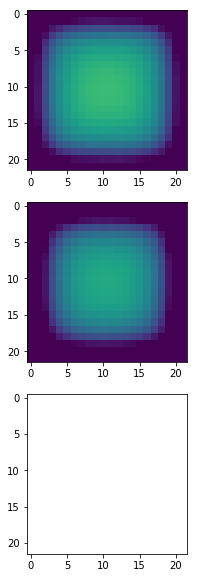

In [11]:
plt.figure(figsize=(10,10))
f = h5py.File(home_dir + 'data/expanded/gen2a_aug/set1_6p4_meas_dense_square_tracks_0pol_76789trans.h5','r')
f2 = h5py.File(home_dir + 'data/expanded/gen2a_aug/gen2a_combined_aug6-7.h5','r')

plt.subplot(311)
plt.imshow(np.mean(f['train']['tracks_cube'][:],axis=0),norm=LogNorm(vmin=3, vmax=200))
plt.subplot(312)
plt.imshow(np.mean(f2['test']['tracks_cube'][:],axis=0),norm=LogNorm(vmin=3, vmax=200))
plt.subplot(313)
plt.imshow(np.mean(f2['test']['tracks_cube'][:],axis=0) - np.mean(f['train']['tracks_cube'][:],axis=0),norm=LogNorm(vmin=3, vmax=200))

In [29]:
np.max(f['train']['tracks_cube'][:11000],axis=0)

array([[ 431,  472,  422,  449,  421,  436,  418,  405,  420,  419,  421,
         420,  451,  425,  476,  448,  404,  407,  398,  379,  462,  492],
       [ 402,  405,  427,  473,  423,  504,  419,  442,  444,  419,  446,
         421,  429,  437,  448,  409,  550,  387,  517,  499,  403,  480],
       [ 376,  392,  580,  965,  668,  947,  637,  682,  448,  572,  512,
         677,  781,  681,  857,  786,  626, 1520, 1747, 1159,  490,  447],
       [ 431,  422,  814, 1183,  936,  947,  893,  942,  765,  713,  826,
         729,  920, 1026,  726, 1115,  816, 1085, 1801, 1556,  730,  394],
       [ 415,  416,  745,  986,  895,  684,  861,  670,  620,  663,  713,
         668,  964,  931,  944,  756,  941, 1073, 1810, 1055,  433,  451],
       [ 465,  437,  632,  709,  750,  824,  761,  600,  661,  647,  644,
         485,  691,  721,  603,  677,  822,  873,  982,  849,  442,  404],
       [ 476,  435,  649,  852,  840,  696,  680,  602,  634,  597,  500,
         545,  521,  647,  534, 

In [22]:
len(os.listdir(home_dir + 'data/expanded/gen2a_test/train'))

29411

In [37]:
class H5Dataset(data.Dataset):
    def __init__(self, dirr, ):
          'Initialization'
          self.length = len(os.listdir(dirr))
          self.dir = dirr
            
    def __len__(self):
          'Denotes the total number of samples'
          return self.length
  
    def __getitem__(self, index):
          'Generates one sample of data'  
          # Load data and get label
          X, y, _ = torch.load(self.dir + str(index) + '.pt')
  
          return (X, y)

In [38]:
data_dir = home_dir + 'data/expanded/gen2a_test/train/'

# with h5py.File(data_file, 'r') as f:
#     mean = f['train']['tracks_mean'][()]
#     std = f['train']['tracks_std'][()] 
#     maxx = f['train']['tracks_max'][()]

kwargs = {'num_workers': 8, 'pin_memory': True}
test = H5Dataset(data_dir)#'test', 'meas', losstype='cos',transform=transforms.Compose([ZNormalize(mean=mean,std=std,set_max=maxx), ToTensor()]))
test_loader = torch.utils.data.DataLoader(test, batch_size=256, shuffle=True, **kwargs)


In [39]:
for batch_idx, (X_batch, y_batch) in enumerate(test_loader):
    print(batch_idx)
    print(X_batch.shape)

0
torch.Size([256, 6, 22, 22])
1
torch.Size([256, 6, 22, 22])
2
torch.Size([256, 6, 22, 22])
3
torch.Size([256, 6, 22, 22])
4
torch.Size([256, 6, 22, 22])
5
torch.Size([256, 6, 22, 22])
6
torch.Size([256, 6, 22, 22])
7
torch.Size([256, 6, 22, 22])
8
torch.Size([256, 6, 22, 22])
9
torch.Size([256, 6, 22, 22])
10
torch.Size([256, 6, 22, 22])
11
torch.Size([256, 6, 22, 22])
12
torch.Size([256, 6, 22, 22])
13
torch.Size([256, 6, 22, 22])
14
torch.Size([256, 6, 22, 22])
15
torch.Size([256, 6, 22, 22])
16
torch.Size([256, 6, 22, 22])
17
torch.Size([256, 6, 22, 22])
18
torch.Size([256, 6, 22, 22])
19
torch.Size([256, 6, 22, 22])
20
torch.Size([256, 6, 22, 22])
21
torch.Size([256, 6, 22, 22])
22
torch.Size([256, 6, 22, 22])
23
torch.Size([256, 6, 22, 22])
24
torch.Size([256, 6, 22, 22])
25
torch.Size([256, 6, 22, 22])
26
torch.Size([256, 6, 22, 22])
27
torch.Size([256, 6, 22, 22])
28
torch.Size([256, 6, 22, 22])
29
torch.Size([256, 6, 22, 22])
30
torch.Size([256, 6, 22, 22])
31
torch.Size([256

KeyboardInterrupt: 

In [40]:
x = (1,2,3,4)

In [41]:
x[1:3]

(2, 3)

In [2]:
x = torch.rand(4)

In [9]:
x.cpu().shape[0]

4

In [54]:
x.uint16().type()

AttributeError: 'Tensor' object has no attribute 'uint16'

In [7]:
with open('TEST.txt', 'w') as f:
    f.write("""#!/bin/bash
#SBATCH --job-name=testALP
#SBATCH --time=210:00
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=2
#SBATCH --mem-per-cpu=20G
#SBATCH --partition=kipac
####SBATCH --gres gpu:1
#SBATCH --array=1-10

ml python/2.7.13
ml py-numpy/1.14.3_py27
ml py-scipy/1.1.0_py27
ml py-matplotlib/2.2.2_py27

source setup.sh
cd bin
./ixpesim -n 10000 --random-seed 1 --output-file /scratch/groups/rwr/alpv95/data/gen4/gen4_ang165_3p6.fits --log-file /scratch/groups/rwr/alpv95/data/gen4/gen4_ang165_3p6.log --src-energy $SLURM_ARRAY_TASK_ID --src-polarized 0 --src-pol-angle 0 --gem-eff-gain 190
""")

In [8]:
string = """#!/bin/bash
#SBATCH --job-name=testALP
#SBATCH --time=210:00
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=2
#SBATCH --mem-per-cpu=20G
#SBATCH --partition=kipac
####SBATCH --gres gpu:1
#SBATCH --array=1-10

ml python/2.7.13
ml py-numpy/1.14.3_py27
ml py-scipy/1.1.0_py27
ml py-matplotlib/2.2.2_py27

source setup.sh
cd bin
./ixpesim -n 10000 --random-seed 1 --output-file /scratch/groups/rwr/alpv95/data/gen4/gen4_ang165_3p6.fits --log-file /scratch/groups/rwr/alpv95/data/gen4/gen4_ang165_3p6.log --src-energy $SLURM_ARRAY_TASK_ID --src-polarized 0 --src-pol-angle 0 --gem-eff-gain 190
"""

In [6]:
np.linspace(1.5,9,76)

array([1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7,
       2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4. ,
       4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2, 5.3,
       5.4, 5.5, 5.6, 5.7, 5.8, 5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5, 6.6,
       6.7, 6.8, 6.9, 7. , 7.1, 7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9,
       8. , 8.1, 8.2, 8.3, 8.4, 8.5, 8.6, 8.7, 8.8, 8.9, 9. ])

In [5]:
np.linspace(2.0,8.0,61)

array([2. , 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2,
       3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5,
       4.6, 4.7, 4.8, 4.9, 5. , 5.1, 5.2, 5.3, 5.4, 5.5, 5.6, 5.7, 5.8,
       5.9, 6. , 6.1, 6.2, 6.3, 6.4, 6.5, 6.6, 6.7, 6.8, 6.9, 7. , 7.1,
       7.2, 7.3, 7.4, 7.5, 7.6, 7.7, 7.8, 7.9, 8. ])

In [4]:
np.linspace(7.9,10.0,22)

array([ 7.9,  8. ,  8.1,  8.2,  8.3,  8.4,  8.5,  8.6,  8.7,  8.8,  8.9,
        9. ,  9.1,  9.2,  9.3,  9.4,  9.5,  9.6,  9.7,  9.8,  9.9, 10. ])

In [2]:
for i in [10.0]:
    job_opts = {'energy': np.round(i,2), 'energy_str':str(np.round(i,2)).replace(".","p"), 'seed': int(i*3034 - i**2.1)}
    with open(home_dir + 'moments/gpdsw/job.sh', 'w') as f:
        f.write("""#!/bin/bash
#SBATCH --job-name=ALP_{energy}
#SBATCH --time=20:00
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=1
#SBATCH --mem-per-cpu=7G
#SBATCH --partition=owners

ml python/2.7.13
ml py-numpy/1.14.3_py27
ml py-scipy/1.1.0_py27
ml py-matplotlib/2.2.2_py27

source setup.sh
cd bin
./ixpesim -n 30000 --random-seed {seed} --output-file /scratch/groups/rwr/alpv95/data/TEST/gen4_{energy_str}.fits --log-file /scratch/groups/rwr/alpv95/data/TEST/gen4_{energy_str}.log --src-energy {energy} --src-polarized 1 --src-pol-angle 90 --gem-eff-gain 190 --dme-pressure 733 
""".format(**job_opts))
    out = subprocess.run('cd /home/groups/rwr/alpv95/tracksml/moments/gpdsw/ && sbatch job.sh',
                            stdout=subprocess.PIPE, stderr=subprocess.PIPE, shell=True)

In [3]:
out

CompletedProcess(args='cd /home/groups/rwr/alpv95/tracksml/moments/gpdsw/ && sbatch job.sh', returncode=0, stdout=b'Submitted batch job 12801387\n', stderr=b'')

In [2]:
for i in np.linspace(1.5,9,76):
    for angle in [0,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170]:
        job_opts = {'energy': np.round(i,2), 'energy_str':str(np.round(i,2)).replace(".","p"), 'seed': int((879+ i*94 - i**1.6)*(1+angle/10)), 
                    'angle': int(angle), 'angle_str': str(int(angle))}
        with open(home_dir + 'moments/gpdsw/job.sh', 'w') as f:
            f.write("""#!/bin/bash
#SBATCH --job-name={energy}_{angle_str}
#SBATCH --time=50:00
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=1
#SBATCH --mem-per-cpu=7G
#SBATCH --partition=owners

ml python/2.7.13
ml py-numpy/1.14.3_py27
ml py-scipy/1.1.0_py27
ml py-matplotlib/2.2.2_py27

source setup.sh
cd bin
./ixpesim -n 10000 --random-seed {seed} --output-file /scratch/groups/rwr/alpv95/data/gen4/gen4_ang{angle_str}_{energy_str}.fits --log-file /scratch/groups/rwr/alpv95/data/gen4/gen4_ang{angle_str}_{energy_str}.log --src-energy {energy} --src-polarized 1 --src-pol-angle {angle} --gem-eff-gain 190 --dme-pressure 733 
""".format(**job_opts))
        out = subprocess.run('cd /home/groups/rwr/alpv95/tracksml/moments/gpdsw/ && sbatch job.sh',
                            stdout=subprocess.PIPE, stderr=subprocess.PIPE, shell=True)

In [10]:
from astropy.io import fits
data_dir = home_dir +"moments/gpdsw/CALDB/gpd/gem_gain_sample.fits"
with fits.open(data_dir, memmap=False) as hdu:
    hdu.info()
    x = hdu[0].data
    #data = hdu[1].data
#     print(hdu[2].columns)
#     print(hdu[3].columns)

Filename: /home/groups/rwr/alpv95/tracksml/moments/gpdsw/CALDB/gpd/gem_gain_sample.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       7   (300, 352)   float64   


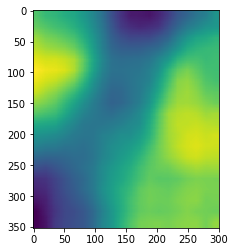

In [11]:
plt.imshow(x)

In [6]:
out

CompletedProcess(args='cd /home/groups/rwr/alpv95/tracksml/moments/gpdsw/ && sbatch job.sh', returncode=0, stdout=b'Submitted batch job 55756454\n', stderr=b'')

In [ ]:
Source options:
  --src-beam-on arg (=1)                enable the Geant4 particle source
  --src-particle arg (=gamma)           source particle [gamma, proton, alpha]
  --src-morphology arg (=gauss)         source morphology [gauss, flat]
  --src-pos-x arg (=0)                  x position of the source centroid [mm]
  --src-pos-y arg (=0)                  y position of the source centroid [mm]
  --src-pos-z arg (=20)                 z position of the source centroid [mm]
  --src-sigma arg (=0.25)               source 1-sigma extension [mm]
  --src-theta arg (=-180)               source beam polar angle [deg]
  --src-phi arg (=0)                    source beam azimuthal angle [deg]
  --src-spectrum arg (=line)            source spectrum [line, Fe55, powerlaw, 
                                        user]
  --src-energy arg (=4)                 source energy [keV]
  --src-index arg (=-2)                 source spectral index
  --src-spec-file arg                   path to the source spectrum file
  --src-polarized arg (=0)              source is (100%) polarized?
  --src-pol-angle arg (=0)              polarization angle [deg]
  --src-rate arg (=50)                  source rate [Hz]

Gas-mixture options:
  --dme-pressure arg (=800)             DME pressure [mbar]
  --fill-temperature arg (=20)          Filling temperature [deg C]
  --excitation-energy arg (=100)        mean excitation energy [eV]
  --ionization-energy arg (=24.5679)    mean ionization energy [eV]
  --fano-factor arg (=0.3)              Fano factor
  --abs-diff-sigma arg (=68)            diffusion sigma in the absorption gap @
                                        800 mbar [um/sqrt(cm)]
  --abs-attach-coeff arg (=0)           attachment coefficient in the 
                                        absorption gap [1/mm]
  --transf-diff-sigma arg (=136)        effective diffusion sigma in the 
                                        transfer gap @ 800 mbar [um/sqrt(cm)]

Detector options:
  --gem-eff-gain arg (=190)             GEM effective gain
  --gem-capture-prob arg (=0.65)        Capture probability for events absorbed
                                        in the GEM copper
  --transfer-gap arg (=0.775)           Thickness of the transfer gap [mm]
  --drift-gap arg (=10)                 Thickness of the drift gap [mm]
  --num-pac-electrons arg (=1)          number of electrons per packet

Readout options:
  --trg-threshold-dac arg (=300)        relative trigger threshold [DAC]
  --readout-clock-demultiplier arg (=8) readout clock demultiplier
  --adc-resolution arg (=14)            ADC resolution [bit]
  --xpol-enc arg (=20)                  XPOL equivalent noise charge 
                                        [electrons]
  --num-ped-samples arg (=1)            Samples for pedestal subtraction (<=0 
                                        preloaded)
  --zero-sup-threshold arg (=0)         zero suppression threshold [ADC counts]
  --diagnostic-prescale arg (=1)        diagnostic event prescale
  --min-window-size arg (=300)          minimum window size
  --max-window-size arg (=3000)         maximum window size

Internal charge injection options:
  --calibration-enabled arg (=0)        enable the XPOL internal 
                                        charge-injection system
  --calibration-col arg (=150)          pixel address column for charge 
                                        injection
  --calibration-row arg (=176)          pixel address row for charge injection
  --calibration-dac arg (=100)          calibration signal [DAC]

Calibration options:
  --calib-xpol-noise arg                path to the XPOL noise calibration file
  --calib-xpol-gain arg                 path to the XPOL gain calibration file
  --calib-trigger-threshold arg         path to the trigger threshold 
                                        calibration file
  --calib-gem-gain arg                  path to the GEM gain calibration file
  --calib-window-timing-corr arg        path to the window timing correction 
                                        calibration file
  --calib-row-timing-corr arg           path to the row timing correction 
                                        calibration file
  --coherent-noise-offset arg (=0)      Coherent column offset
  --trigger-minicluster-offset arg (=0) Trigger mincluster offset